# **CUSTOMER CHURN PREDICTION – TELECOM INDUSTRY**
## Data Science Co-op Diploma Final Project
Author: Maria Jose Teran

---
## Project Overview
This project aims to develop a machine learning model to predict customer churn in a telecom company. Accurate predictions will help improve customer retention strategies and reduce revenue loss.


## Problem Statement

#### Objective

To build a classification model that predicts whether a customer will churn (leave the service), and to identify the main factors that contribute to churn.  
This will contribute to:
- Improving retention strategies  
- Reducing customer loss  
- Enhancing overall customer satisfaction

#### Problem Type

- Binary classification problem

#### Objective Variable (Target)

- `Churn`: Whether the customer has left the company (`Yes`) or not (`No`)

#### Evaluation Metrics

- **Accuracy**  
- **Precision**  
- **Recall**  
- **F1-Score**  
- **AUC (Area Under ROC Curve)**

---

## Data Description

**Dataset Source**  
- IBM Telco Customer Churn Dataset
  - [Hugging Face extended version](https://huggingface.co/datasets/aai510-group1/telco-customer-churn)

**Main Features Include**
- Customer demographics: `gender`, `SeniorCitizen`, `Partner`, `Dependents`  
- Services signed up: `PhoneService`, `InternetService`, `StreamingTV`, `StreamingMovies`, etc.  
- Technical support and billing features: `TechSupport`, `OnlineBackup`, `PaperlessBilling`, `PaymentMethod`  
- Account information: `Contract`, `MonthlyCharges`, `TotalCharges`, `TenureMonths`, `CustomerStatus`  
- Target variable: `Churn` (binary)

---

## Tools & Technologies

- Python: `pandas`, `NumPy`, `scikit-learn`  
- Visualization: `matplotlib`, `seaborn`  
- Evaluation: classification metrics from `sklearn`  
- Tableau (for dashboard)  
- Jupyter Notebook

---

## **Initial Data Exploration**

In [315]:
# Import libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sb
import plotly.express as px

import warnings
warnings.filterwarnings('ignore')

In [4]:
# Read input data
df_train = pd.read_csv('data_IBM_extended/train.csv')
df_test = pd.read_csv('data_IBM_extended/test.csv')
df_validation = pd.read_csv('data_IBM_extended/validation.csv')

In [5]:
# Display first rows
df_train.head()

,Age,Avg Monthly GB Download,Avg Monthly Long Distance Charges,Churn Category,Churn Reason,Churn Score,City,CLTV,Contract,Country,...,Tenure in Months,Total Charges,Total Extra Data Charges,Total Long Distance Charges,Total Refunds,Total Revenue,Under 30,Unlimited Data,Zip Code,Churn
0,72,4,19.44,NaN,NaN,51,San Mateo,4849,Two Year,United States,...,25,2191.15,0,486.00,0.0,2677.15,0,1,94403,0
1,27,59,45.62,NaN,NaN,27,Sutter Creek,3715,Month-to-Month,United States,...,35,3418.20,0,1596.70,0.0,5014.90,1,1,95685,0
2,59,0,16.07,NaN,NaN,59,Santa Cruz,5092,Month-to-Month,United States,...,46,851.20,0,739.22,0.0,1590.42,0,0,95064,0
3,25,27,0.00,NaN,NaN,49,Brea,2068,One Year,United States,...,27,1246.40,30,0.00,0.0,1276.40,1,0,92823,0
4,31,21,17.22,Dissatisfaction,Network reliability,88,San Jose,4026,One Year,United States,...,58,3563.80,0,998.76,0.0,4562.56,0,1,95117,1


In [6]:
# Display first rows
df_test.head()

,Age,Avg Monthly GB Download,Avg Monthly Long Distance Charges,Churn Category,Churn Reason,Churn Score,City,CLTV,Contract,Country,...,Tenure in Months,Total Charges,Total Extra Data Charges,Total Long Distance Charges,Total Refunds,Total Revenue,Under 30,Unlimited Data,Zip Code,Churn
0,39,29,18.91,NaN,NaN,54,Bradley,3334,One Year,United States,...,7,477.05,0,132.37,0.0,609.42,0,1,93426,0
1,75,22,33.48,NaN,NaN,54,Lakeshore,2455,Month-to-Month,United States,...,30,3181.80,0,1004.40,0.0,4186.20,0,1,93634,0
2,67,14,9.96,NaN,NaN,26,Lompoc,5011,Two Year,United States,...,71,7904.25,0,707.16,0.0,8611.41,0,1,93437,0
3,47,7,34.64,NaN,NaN,29,Echo Lake,2452,Month-to-Month,United States,...,9,593.85,0,311.76,0.0,905.61,0,1,95721,0
4,21,0,10.49,NaN,NaN,23,Lancaster,4129,One Year,United States,...,25,507.90,0,262.25,0.0,770.15,1,0,93536,0


In [7]:
# Display first rows
df_validation.head()

,Age,Avg Monthly GB Download,Avg Monthly Long Distance Charges,Churn Category,Churn Reason,Churn Score,City,CLTV,Contract,Country,...,Tenure in Months,Total Charges,Total Extra Data Charges,Total Long Distance Charges,Total Refunds,Total Revenue,Under 30,Unlimited Data,Zip Code,Churn
0,43,4,29.19,NaN,NaN,58,Indio,5614,Month-to-Month,United States,...,41,3990.60,0,1196.79,0.0,5187.39,0,1,92203,0
1,59,19,0.00,NaN,NaN,23,Santa Maria,6300,One Year,United States,...,59,1980.30,0,0.00,0.0,1980.30,0,1,93455,0
2,46,6,26.81,NaN,NaN,39,Oakhurst,5135,Two Year,United States,...,63,6330.40,0,1689.03,0.0,8019.43,0,1,93644,0
3,61,6,41.79,NaN,NaN,39,San Francisco,2051,One Year,United States,...,19,1231.85,60,794.01,0.0,2085.86,0,0,94104,0
4,50,0,40.25,NaN,NaN,57,Salinas,5983,Month-to-Month,United States,...,2,62.00,0,80.50,0.0,142.50,0,0,93906,0


In [8]:
# Find the datatypes and info
print(df_train.info())
print(df_test.info())
print(df_validation.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4225 entries, 0 to 4224
Data columns (total 52 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   Age                                4225 non-null   int64  
 1   Avg Monthly GB Download            4225 non-null   int64  
 2   Avg Monthly Long Distance Charges  4225 non-null   float64
 3   Churn Category                     1121 non-null   object 
 4   Churn Reason                       1121 non-null   object 
 5   Churn Score                        4225 non-null   int64  
 6   City                               4225 non-null   object 
 7   CLTV                               4225 non-null   int64  
 8   Contract                           4225 non-null   object 
 9   Country                            4225 non-null   object 
 10  Customer ID                        4225 non-null   object 
 11  Customer Status                    4225 non-null   objec

## **Data Cleaning and Preprocessing**

### Handling duplicated values

In [11]:
# Find duplicate rows
print(f"Duplicates in train are: {len(df_train[df_train.duplicated()])}")
print(f"Duplicates in test are: {len(df_test[df_test.duplicated()])}")
print(f"Duplicates in validation are: {len(df_validation[df_validation.duplicated()])}")

Duplicates in train are: 0
Duplicates in test are: 0
Duplicates in validation are: 0


There is not duplicated rows.

### Handling missing values

In [14]:
# Function Missing values
def show_missing(df, name="DataFrame"):
    missing = df.isnull().sum()
    missing = missing[missing > 0]
    if missing.empty:
        print(f"No missing values found in {name}.")
    else:
        print(f"Missing values in {name}:")
        print(missing)

In [15]:
# Find empty values
show_missing(df_train, 'train')
show_missing(df_test, 'test')
show_missing(df_validation, 'val')

Missing values in train:
Churn Category    3104
Churn Reason      3104
Internet Type      886
Offer             2324
dtype: int64
Missing values in test:
Churn Category    1035
Churn Reason      1035
Internet Type      308
Offer              762
dtype: int64
Missing values in val:
Churn Category    1035
Churn Reason      1035
Internet Type      332
Offer              791
dtype: int64


In [16]:
# Find the percentage of missing data
print('missing values% in df_train:')
for i in df_train.columns:
    percentage_missing_column = df_train[i].isnull().sum()/df_train.shape[0]
    if percentage_missing_column > 0:
        print(f"Percentage of missing values in {i}: {round(percentage_missing_column*100, 2)}%")

missing values% in df_train:
Percentage of missing values in Churn Category: 73.47%
Percentage of missing values in Churn Reason: 73.47%
Percentage of missing values in Internet Type: 20.97%
Percentage of missing values in Offer: 55.01%


In [17]:
# Find the percentage of missing data
print('missing values% in df_test:')
for i in df_test.columns:
    percentage_missing_column = df_test[i].isnull().sum()/df_test.shape[0]
    if percentage_missing_column > 0:
        print(f"Percentage of missing values in {i}: {round(percentage_missing_column*100, 2)}%")

missing values% in df_test:
Percentage of missing values in Churn Category: 73.46%
Percentage of missing values in Churn Reason: 73.46%
Percentage of missing values in Internet Type: 21.86%
Percentage of missing values in Offer: 54.08%


In [18]:
# Find the percentage of missing data
print('missing values% in df_validation:')
for i in df_validation.columns:
    percentage_missing_column = df_validation[i].isnull().sum()/df_validation.shape[0]
    if percentage_missing_column > 0:
        print(f"Percentage of missing values in {i}: {round(percentage_missing_column*100, 2)}%")

missing values% in df_validation:
Percentage of missing values in Churn Category: 73.46%
Percentage of missing values in Churn Reason: 73.46%
Percentage of missing values in Internet Type: 23.56%
Percentage of missing values in Offer: 56.14%


*Note: Churn Category and Churn Reason reflect information only known after a customer has left. Since we’re trying to predict churn before it happens, keeping those columns would leak future information into the model. For that reason, I’ll be dropping them before modeling.*

### Cleaning column Internet Type

In [21]:
# Find empty values
df_train[df_train['Internet Type'].isna()]

,Age,Avg Monthly GB Download,Avg Monthly Long Distance Charges,Churn Category,Churn Reason,Churn Score,City,CLTV,Contract,Country,...,Tenure in Months,Total Charges,Total Extra Data Charges,Total Long Distance Charges,Total Refunds,Total Revenue,Under 30,Unlimited Data,Zip Code,Churn
2,59,0,16.07,NaN,NaN,59,Santa Cruz,5092,Month-to-Month,United States,...,46,851.20,0,739.22,0.00,1590.42,0,0,95064,0
20,46,0,43.80,NaN,NaN,46,El Centro,4691,One Year,United States,...,32,624.15,0,1401.60,0.00,2025.75,0,0,92243,0
24,48,0,19.28,NaN,NaN,57,Huntington Park,5190,Two Year,United States,...,12,224.50,0,231.36,0.00,455.86,0,0,90255,0
25,60,0,47.46,NaN,NaN,53,Chester,3142,Month-to-Month,United States,...,6,109.20,0,284.76,0.00,393.96,0,0,96020,0
29,34,0,40.91,NaN,NaN,79,Santa Barbara,4311,Two Year,United States,...,70,1328.35,0,2863.70,33.29,4158.76,0,0,93103,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4214,22,0,49.83,NaN,NaN,42,Goleta,3149,Month-to-Month,United States,...,7,174.70,0,348.81,0.00,523.51,1,0,93117,0
4216,56,0,23.25,NaN,NaN,49,Los Angeles,5956,One Year,United States,...,42,958.10,0,976.50,0.00,1934.60,0,0,90056,0
4217,56,0,23.84,NaN,NaN,65,Rosamond,5811,Month-to-Month,United States,...,10,199.45,0,238.40,0.00,437.85,0,0,93560,0
4220,36,0,7.76,NaN,NaN,52,Long Beach,4590,Month-to-Month,United States,...,1,19.90,0,7.76,0.00,27.66,0,0,90806,0


In [22]:
# unique Internet Type by Internet Service
df_train.groupby('Internet Service')['Internet Type'].unique().apply(list)

Internet Service
0                        [nan]
1    [Fiber Optic, DSL, Cable]
Name: Internet Type, dtype: object

Nan values on the 'Internet Type' column when 'Internet Service' is 0.
For cleaning, I will fill the nan values when 'Internet Service' is 0 with NA.

In [24]:
# Fill nan Internet Type by Internet Service
df_train.loc[(df_train['Internet Service'] == 0) & (df_train['Internet Type'].isna()), 'Internet Type'] = 'None'
df_test.loc[(df_test['Internet Service'] == 0) & (df_test['Internet Type'].isna()), 'Internet Type'] = 'None'
df_validation.loc[(df_validation['Internet Service'] == 0) & (df_validation['Internet Type'].isna()), 'Internet Type'] = 'None'

In [25]:
# Find empty values
show_missing(df_train, 'train')
show_missing(df_test, 'test')
show_missing(df_validation, 'val')

Missing values in train:
Churn Category    3104
Churn Reason      3104
Offer             2324
dtype: int64
Missing values in test:
Churn Category    1035
Churn Reason      1035
Offer              762
dtype: int64
Missing values in val:
Churn Category    1035
Churn Reason      1035
Offer              791
dtype: int64


### Cleaning column Offer

In [27]:
# unique Offer
print(df_train['Offer'].unique())

[nan 'Offer B' 'Offer E' 'Offer A' 'Offer D' 'Offer C']


In [28]:
# fill nan values in Offer with no offer
df_train['Offer'] = df_train['Offer'].fillna('None')
df_test['Offer'] = df_test['Offer'].fillna('None')
df_validation['Offer'] = df_validation['Offer'].fillna('None')

In [29]:
# Find empty values
show_missing(df_train, 'train')
show_missing(df_test, 'test')
show_missing(df_validation, 'val')

Missing values in train:
Churn Category    3104
Churn Reason      3104
dtype: int64
Missing values in test:
Churn Category    1035
Churn Reason      1035
dtype: int64
Missing values in val:
Churn Category    1035
Churn Reason      1035
dtype: int64


### Cleaning Churn Category and Churn Reason (for EDA purposes)

In [31]:
# Find Churn Reason null
df_train[df_train['Churn Reason'].isnull()]

,Age,Avg Monthly GB Download,Avg Monthly Long Distance Charges,Churn Category,Churn Reason,Churn Score,City,CLTV,Contract,Country,...,Tenure in Months,Total Charges,Total Extra Data Charges,Total Long Distance Charges,Total Refunds,Total Revenue,Under 30,Unlimited Data,Zip Code,Churn
0,72,4,19.44,NaN,NaN,51,San Mateo,4849,Two Year,United States,...,25,2191.15,0,486.00,0.00,2677.15,0,1,94403,0
1,27,59,45.62,NaN,NaN,27,Sutter Creek,3715,Month-to-Month,United States,...,35,3418.20,0,1596.70,0.00,5014.90,1,1,95685,0
2,59,0,16.07,NaN,NaN,59,Santa Cruz,5092,Month-to-Month,United States,...,46,851.20,0,739.22,0.00,1590.42,0,0,95064,0
3,25,27,0.00,NaN,NaN,49,Brea,2068,One Year,United States,...,27,1246.40,30,0.00,0.00,1276.40,1,0,92823,0
6,36,8,10.23,NaN,NaN,77,San Quentin,5436,Month-to-Month,United States,...,24,2210.20,0,245.52,0.00,2455.72,0,1,94964,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4220,36,0,7.76,NaN,NaN,52,Long Beach,4590,Month-to-Month,United States,...,1,19.90,0,7.76,0.00,27.66,0,0,90806,0
4221,77,22,23.43,NaN,NaN,34,San Francisco,5602,One Year,United States,...,22,1820.90,0,515.46,29.88,2306.48,0,1,94127,0
4222,56,0,28.06,NaN,NaN,63,Olivehurst,4458,One Year,United States,...,18,345.90,0,505.08,0.00,850.98,0,0,95961,0
4223,45,22,0.00,NaN,NaN,38,Westlake Village,4115,Month-to-Month,United States,...,57,3437.45,0,0.00,0.00,3437.45,0,1,91361,0


In [32]:
# unique Internet Type by Internet Service
df_train.groupby('Churn')[['Churn Category', 'Churn Reason']].agg(lambda x: x.unique().tolist())

,Churn Category,Churn Reason
Churn,,
0,[nan],[nan]
1,"[Dissatisfaction, Competitor, Price, Attitude,...","[Network reliability, Competitor had better de..."


All nan values in both columns are presented when No Churn, so missing values will be filled with 'NA'.

In [34]:
# Fill nan 'Churn Category', 'Churn Reason' with NA
df_train[['Churn Category', 'Churn Reason']] = df_train[['Churn Category', 'Churn Reason']].fillna('NA')
df_test[['Churn Category', 'Churn Reason']] = df_test[['Churn Category', 'Churn Reason']].fillna('NA')
df_validation[['Churn Category', 'Churn Reason']] = df_validation[['Churn Category', 'Churn Reason']].fillna('NA')

In [35]:
# Find empty values
show_missing(df_train, 'train')
show_missing(df_test, 'test')
show_missing(df_validation, 'val')

No missing values found in train.
No missing values found in test.
No missing values found in val.


## **Exploratory data Analisys (EDA)**

In [37]:
# Dataframe for EDA
df_EDA = pd.concat([df_train, df_test, df_validation], ignore_index=True)
df_EDA.set_index("Customer ID", inplace=True)
df_EDA.head()

,Age,Avg Monthly GB Download,Avg Monthly Long Distance Charges,Churn Category,Churn Reason,Churn Score,City,CLTV,Contract,Country,...,Tenure in Months,Total Charges,Total Extra Data Charges,Total Long Distance Charges,Total Refunds,Total Revenue,Under 30,Unlimited Data,Zip Code,Churn
Customer ID,,,,,,,,,,,,,,,,,,,,,
4526-ZJJTM,72,4,19.44,NA,NA,51,San Mateo,4849,Two Year,United States,...,25,2191.15,0,486.00,0.0,2677.15,0,1,94403,0
5302-BDJNT,27,59,45.62,NA,NA,27,Sutter Creek,3715,Month-to-Month,United States,...,35,3418.20,0,1596.70,0.0,5014.90,1,1,95685,0
5468-BPMMO,59,0,16.07,NA,NA,59,Santa Cruz,5092,Month-to-Month,United States,...,46,851.20,0,739.22,0.0,1590.42,0,0,95064,0
2212-LYASK,25,27,0.00,NA,NA,49,Brea,2068,One Year,United States,...,27,1246.40,30,0.00,0.0,1276.40,1,0,92823,0
0378-XSZPU,31,21,17.22,Dissatisfaction,Network reliability,88,San Jose,4026,One Year,United States,...,58,3563.80,0,998.76,0.0,4562.56,0,1,95117,1


In [38]:
print("Number of unique values per column")
for i in df_EDA.columns:
    print(f"- {i} ({df_EDA[i].dtype}): {df_EDA[i].nunique()}")

Number of unique values per column
- Age (int64): 62
- Avg Monthly GB Download (int64): 50
- Avg Monthly Long Distance Charges (float64): 3584
- Churn Category (object): 6
- Churn Reason (object): 21
- Churn Score (int64): 81
- City (object): 1106
- CLTV (int64): 3438
- Contract (object): 3
- Country (object): 1
- Customer Status (object): 3
- Dependents (int64): 2
- Device Protection Plan (int64): 2
- Gender (object): 2
- Internet Service (int64): 2
- Internet Type (object): 4
- Lat Long (object): 1679
- Latitude (float64): 1626
- Longitude (float64): 1625
- Married (int64): 2
- Monthly Charge (float64): 1585
- Multiple Lines (int64): 2
- Number of Dependents (int64): 10
- Number of Referrals (int64): 12
- Offer (object): 6
- Online Backup (int64): 2
- Online Security (int64): 2
- Paperless Billing (int64): 2
- Partner (int64): 2
- Payment Method (object): 3
- Phone Service (int64): 2
- Population (int64): 1569
- Premium Tech Support (int64): 2
- Quarter (object): 1
- Referred a Frien

### Distributions

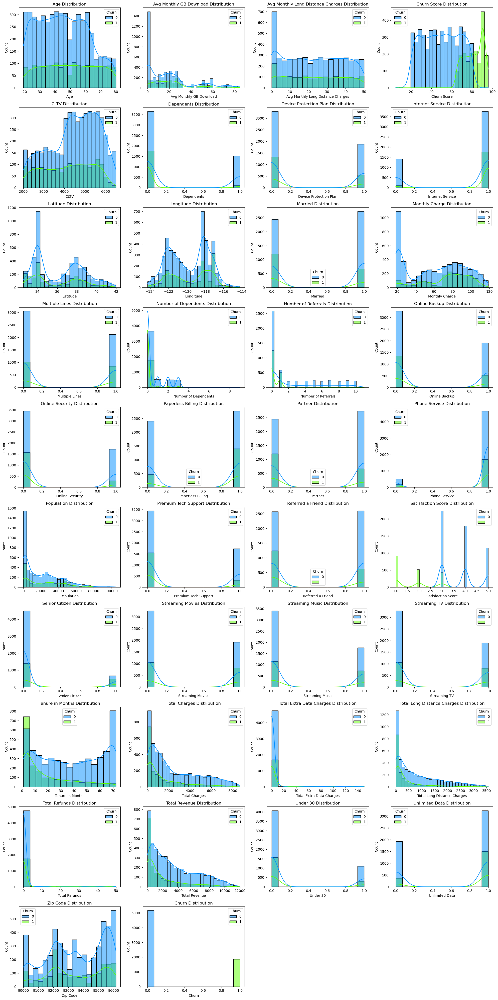

In [40]:
# Numeric columns distribution
cols_to_plot = df_EDA.select_dtypes(include=['int64', 'float64']).columns

fig, axes = plt.subplots(10, 4, figsize=(20, 40))
axes = axes.flatten()

for i, col in enumerate(cols_to_plot):
    sb.histplot(data=df_EDA, x=col, ax=axes[i], palette='gist_rainbow_r', kde=True, hue='Churn')
    axes[i].set_title(f"{col} Distribution")

# Hide unused subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

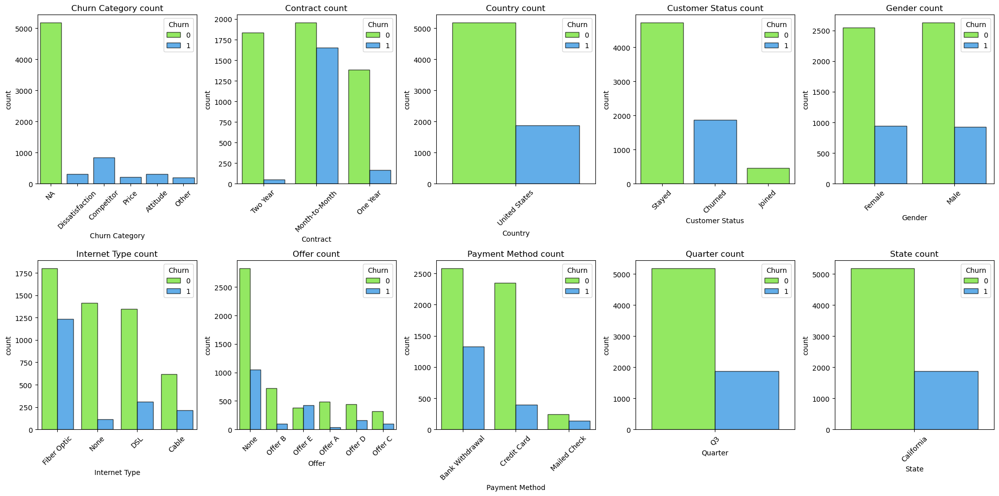

In [41]:
# Categorical columns distribution
cols_to_plot = ['Churn Category', 'Contract', 'Country', 'Customer Status', 'Gender', 'Internet Type', 'Offer', 'Payment Method', 'Quarter', 'State']

fig, axes = plt.subplots(2, 5, figsize=(20, 10))
axes = axes.flatten()

for i, col in enumerate(cols_to_plot):
    sb.countplot(data=df_EDA, x=col, ax=axes[i], palette='gist_rainbow', hue='Churn', alpha=0.7, edgecolor='black')
    axes[i].set_title(f"{col} count")
    axes[i].tick_params(axis='x', rotation=45)

plt.tight_layout()
plt.show()

In [42]:
# Count the number of rows where 'Married' and 'Partner' values are different
different_rows = (df_EDA["Married"] != df_EDA["Partner"]).sum()
print(f"Rows where Married and Partner are different: {different_rows}")

Rows where Married and Partner are different: 0


So, Partner column will not be considered.

### Customer Attributes and Churn

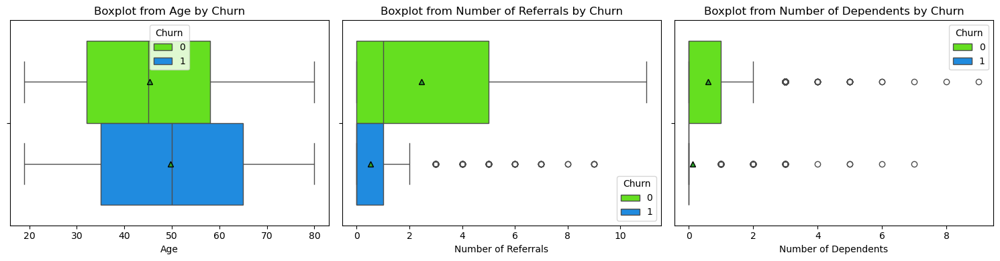

In [45]:
# Boxplot distributions
cols_to_plot = ['Age', 'Number of Referrals', 'Number of Dependents']

fig, axes = plt.subplots(1, 3, figsize=(15, 4))
axes = axes.flatten()

for i, col in enumerate(cols_to_plot):
    sb.boxplot(data=df_EDA, x=col, ax=axes[i], palette='gist_rainbow', showmeans=True, hue='Churn', meanprops={"markeredgecolor": "black"})
    axes[i].set_title(f"Boxplot from {col} by Churn")

plt.tight_layout()
plt.show()

Customers who churn tend to be younger, have fewer referrals, and fewer dependents compared to those who stay.

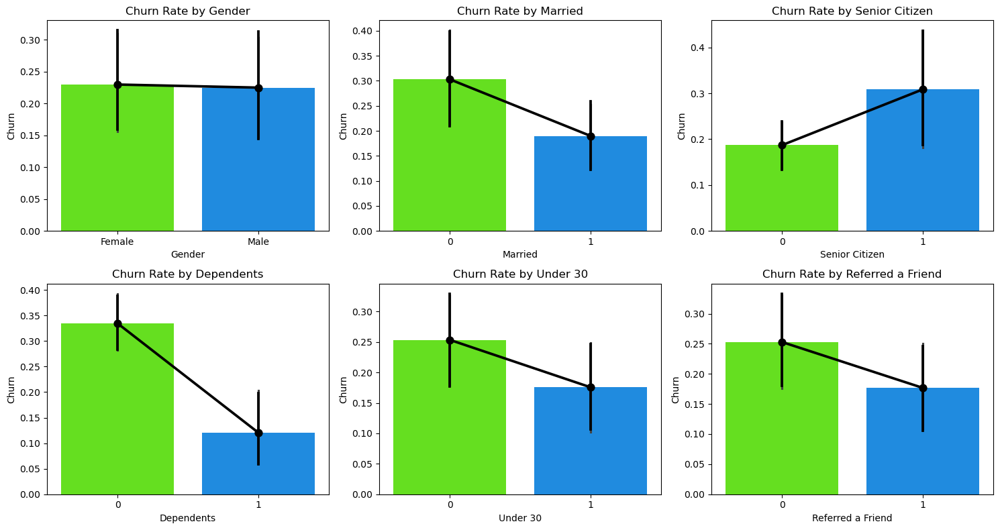

In [47]:
cols_to_plot = ["Gender", "Married", "Senior Citizen", "Dependents", "Under 30", "Referred a Friend"]
fig, axes = plt.subplots(2, 3, figsize=(15, 8))
axes = axes.flatten()

churn_rates = df_EDA.groupby(cols_to_plot)["Churn"].mean().reset_index()

for i, col in enumerate(cols_to_plot):
    sb.barplot(data=churn_rates, x=col, y="Churn", ax=axes[i], palette="gist_rainbow")
    sb.pointplot(data=churn_rates, x=col, y="Churn", ax=axes[i], color='black')
    axes[i].set_title(f"Churn Rate by {col}")

plt.tight_layout()
plt.show()

Churn is lower among customers who are married, over 30, have dependents, or have referred a friend, suggesting that personal or service connections reduce churn.

### Geografical Analysis

In [50]:
grouped = df_EDA.groupby('City')['Churn'].mean().reset_index()
grouped_sorted = grouped.sort_values(by='Churn', ascending=False)

fig = px.bar(
    grouped_sorted,
    x='City',
    y='Churn',
    title='Average Churn Rate by City',
    labels={'Churn': 'Churn Rate'},
    color='Churn',
    color_discrete_sequence=px.colors.sequential.Inferno_r
)

fig.update_layout(xaxis_tickangle=45)
fig.update_layout(height=500)
fig.update_layout(template='simple_white')
fig.show()

In [51]:
df_map = df_EDA.reset_index()
df_map1_grouped = df_map.groupby(['City', 'Latitude', 'Longitude']).agg(Customer_Count=('Customer ID', 'count'), Churn_Rate=('Churn', 'mean')).reset_index()

# Plot Churn by City
fig = px.scatter_geo(df_map1_grouped,
                     lat='Latitude',
                     lon='Longitude',
                     size='Customer_Count',
                     color='Churn_Rate',
                     hover_name='City',
                     scope='usa',
                     title='Churn Rate and Customer Count by City',
                     color_continuous_scale='plotly3')

fig.update_layout(height=700, width=1000)
fig.show()

### Revenue Behavior Over Tenure

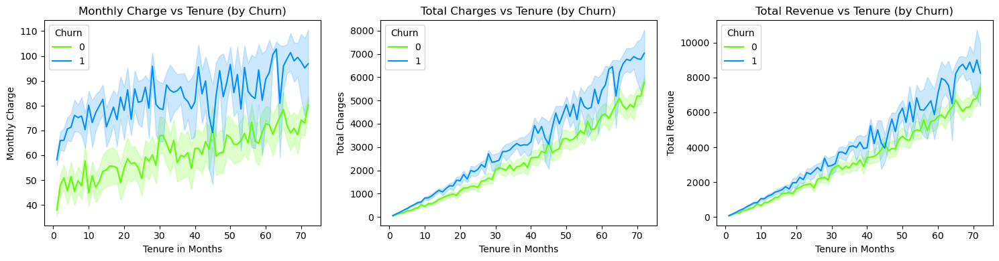

In [53]:
# Lineplots for understanding Revenue Behavior
cols_to_plot = ['Monthly Charge', 'Total Charges', 'Total Revenue']

fig, axes = plt.subplots(1, 3, figsize=(15, 4))
axes = axes.flatten()
for i, col in enumerate(cols_to_plot):
    sb.lineplot(data=df_EDA, hue='Churn',x='Tenure in Months', y=col, palette='gist_rainbow', ax=axes[i])
    axes[i].set_title(f"{col} vs Tenure (by Churn)")

plt.tight_layout()
plt.show()

### Retention and Risk Trends

In [55]:
df_payment = df_EDA.groupby(['Tenure in Months', 'Payment Method'])['Churn'].mean().reset_index()

fig = px.line(
    df_payment,
    x='Tenure in Months',
    y='Churn',
    color='Payment Method',
    title='Churn Rate by Payment Method Over Tenure',
    markers=True)
fig.update_layout(height=500)
fig.update_layout(template='simple_white')
fig.show()

In [56]:
df_churn_trend = df_EDA.groupby(['Tenure in Months', 'Contract'])['Churn'].mean().reset_index()

fig = px.line(
    df_churn_trend,
    x='Tenure in Months',
    y='Churn',
    color='Contract',
    title='Churn Rate by Tenure and Contract Type',
    labels={'Churn': 'Average Churn Rate'},
    markers=True
)

fig.update_layout(height=500)
fig.update_layout(template='simple_white')
fig.show()


### Churn by Service

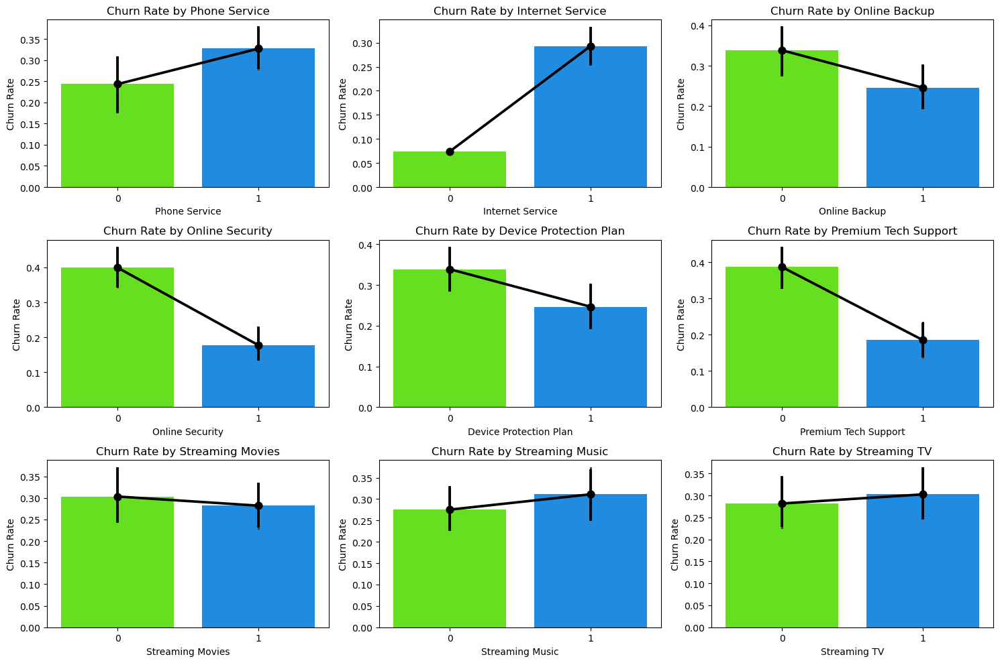

In [58]:
# List of service-related columns
service_cols = ["Phone Service", "Internet Service", "Online Backup", "Online Security", "Device Protection Plan", "Premium Tech Support", \
                "Streaming Movies", "Streaming Music", "Streaming TV"]

# Create subplots
fig, axes = plt.subplots(3, 3, figsize=(15, 10))
axes = axes.flatten()

# Grouped churn rates
churn_rates = df_EDA.groupby(service_cols)["Churn"].mean().reset_index()

# Plot each service
for i, col in enumerate(service_cols):
    sb.barplot(data=churn_rates, x=col, y="Churn", ax=axes[i], palette="gist_rainbow")
    sb.pointplot(data=churn_rates, x=col, y="Churn", ax=axes[i], color='black', markers='o', linestyles='-')
    axes[i].set_title(f"Churn Rate by {col}")
    axes[i].set_ylabel("Churn Rate")

plt.tight_layout()
plt.show()


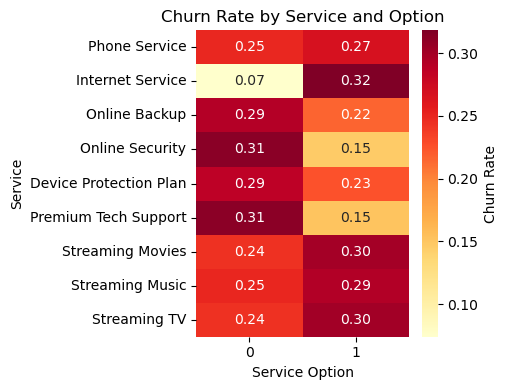

In [59]:
# Select only service columns and churn
service_cols = ["Phone Service", "Internet Service", "Online Backup", "Online Security", "Device Protection Plan", "Premium Tech Support", "Streaming Movies", "Streaming Music", "Streaming TV"]

# Calculate churn rate for each category in each service column
churn_table = pd.DataFrame()
for col in service_cols:
    churn_rate = df_EDA.groupby(col)['Churn'].mean()
    churn_table[col] = churn_rate

# services as rows
churn_table = churn_table.T

# Plot heatmap
plt.figure(figsize=(5, 4))
sb.heatmap(data=churn_table, annot=True, cmap="YlOrRd", fmt=".2f", cbar_kws={'label': 'Churn Rate'})
plt.title("Churn Rate by Service and Option")
plt.ylabel("Service")
plt.xlabel("Service Option")
plt.tight_layout()
plt.show()

* Customers without support-related services (like security, backup, or tech support) show consistently higher churn rates than those who have them.
* Churn is higher among customers who use streaming services, Phone and Internet Services.

### Offer Analysis

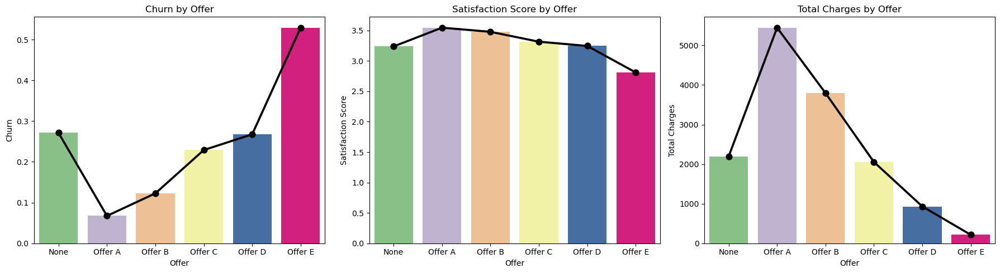

In [62]:
# Metrics to plot per Offer
cols = ['Churn', 'Satisfaction Score', 'Total Charges']
titles = ['Churn Rate by Offer', 'Average Satisfaction Score by Offer', 'Average Monthly Charge by Offer']

# Prepare summary table
offer_summary = df_EDA.groupby('Offer')[cols].mean().reset_index()

# Create subplots
fig, axes = plt.subplots(1, 3, figsize=(18, 5))
for i, col in enumerate(cols):
    sb.barplot(data=offer_summary, x='Offer', y=col, ax=axes[i], palette="Accent")
    sb.pointplot(data=offer_summary, x='Offer', y=col, ax=axes[i], color='black', markers='o', linestyles='-')
    axes[i].set_title(f"{col} by Offer")
plt.tight_layout()
plt.show()

Offer E shows the highest churn and lowest satisfaction and charges, indicating poor performance and potential dissatisfaction affects churn more, despite being low-cost.

### Churn, Satisfaction, CLTV and Retention Analysis

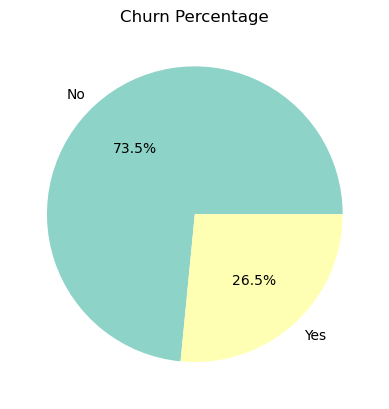

In [65]:
# Plot churn %
churn_counts = df_EDA['Churn'].value_counts()
label_mapping = {0: "No", 1: "Yes"}
labels = [label_mapping[i] for i in churn_counts.index]

plt.pie(churn_counts, labels=labels, autopct='%1.1f%%', colors=sb.color_palette('Set3'))
plt.title('Churn Percentage')
plt.show()

The churn rate is 26.5%.

In [67]:
# Mapping repeated churn reasons
df_EDA.loc[(df_EDA['Churn Reason'] == 'Poor expertise of online support'), 'Churn Category'] = 'Dissatisfaction'

# Filter churn =  and group by 'Churn Category', 'Churn Reason'
churn_reason = df_EDA[df_EDA['Churn'] == 1][['Churn Category', 'Churn Reason']].value_counts().reset_index(name='Count')

In [68]:
# Sunburst chart
fig_churn_category = px.sunburst(
    churn_reason,
    path=['Churn Category', 'Churn Reason'],
    values='Count',
    title='Churn Reasons by Category',
    color_discrete_sequence=px.colors.qualitative.Set3)
fig_churn_category.update_traces(
    textinfo='label+percent entry',
    insidetextorientation='radial')
fig_churn_category.update_layout(height=800)
fig_churn_category.show()

In [69]:
# Filter and group churned customers
churned = df_EDA[df_EDA['Churn'] == 1]
churned_satisfaction = churned.groupby(['Churn Category', 'Churn Reason'])['Satisfaction Score'].mean().reset_index()

# Plot with Plotly
fig = px.scatter(
    churned_satisfaction,
    x='Churn Reason',
    y='Churn Category',
    size='Satisfaction Score',
    color='Satisfaction Score',
    hover_data={'Satisfaction Score': ':.2f'},
    title='Churn Reasons/Category by Satisfaction Score (Churned customers)',
    color_continuous_scale='YlOrRd_r')

fig.update_layout(xaxis_tickangle=45, height=600, width=1000)
fig.update_layout(template='simple_white')
fig.show()

Customers who left due to dissatisfaction had the lowest satisfaction scores, showing that poor service experience, and competitors' better offers are key reasons for people to decide to leave.

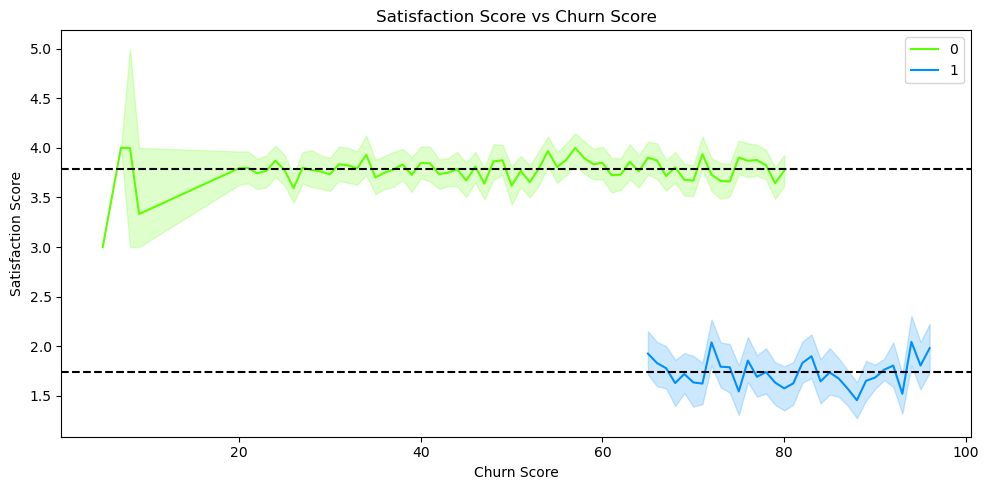

In [71]:
# Sort by Churn Score
df_plot = df_EDA.sort_values('Churn Score')

# lineplot
plt.figure(figsize=(10, 5))
sb.lineplot(data=df_plot, x='Churn Score', y='Satisfaction Score', hue='Churn', palette='gist_rainbow')

# mean Satisfaction Score by Churn group
mean_churn_0 = df_plot[df_plot['Churn'] == 0]['Satisfaction Score'].mean()
mean_churn_1 = df_plot[df_plot['Churn'] == 1]['Satisfaction Score'].mean()
plt.axhline(mean_churn_0, color='black', linestyle='--')
plt.axhline(mean_churn_1, color='black', linestyle='--')

plt.title('Satisfaction Score vs Churn Score')
plt.legend()
plt.tight_layout()
plt.show()

Customers who churn tend to have significantly lower average satisfaction scores compared to those who stay, confirming satisfaction as a key churn driver.

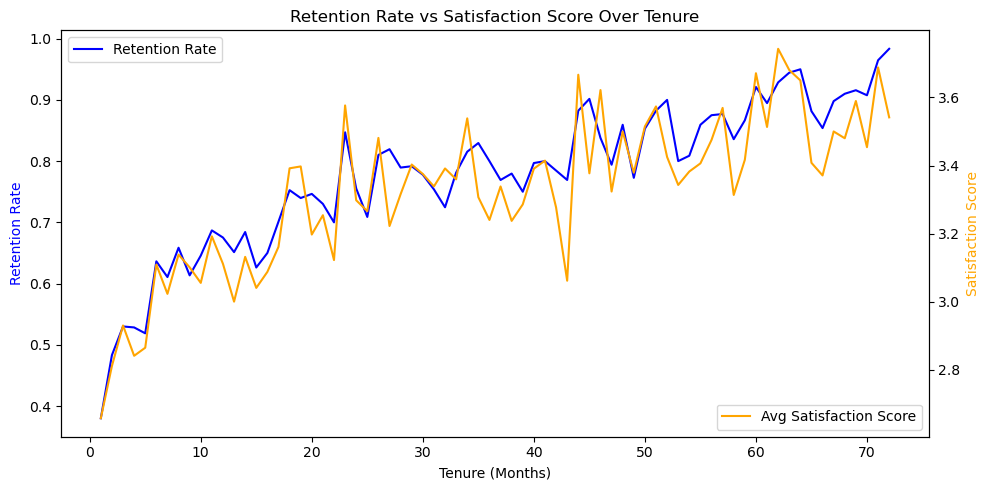

In [73]:
# Retention = 1 - Churn
df_EDA['Retention'] = 1 - df_EDA['Churn']

# Curve for retention
ret_curve = df_EDA.groupby('Tenure in Months').agg(Retention_Rate=('Retention', 'mean'), Satisfaction_Score=('Satisfaction Score', 'mean')).reset_index()

fig, ax1 = plt.subplots(figsize=(10, 5))
sb.lineplot(data=ret_curve, x='Tenure in Months', y='Retention_Rate', ax=ax1, color='blue', label='Retention Rate')
ax1.set_ylabel("Retention Rate", color='blue')
ax1.set_xlabel("Tenure (Months)")

ax2 = ax1.twinx()
sb.lineplot(data=ret_curve, x='Tenure in Months', y='Satisfaction_Score', ax=ax2, color='orange', label='Avg Satisfaction Score')
ax2.set_ylabel("Satisfaction Score", color='orange')
ax2.legend(loc='lower right')

plt.title("Retention Rate vs Satisfaction Score Over Tenure")
fig.tight_layout()
plt.show()

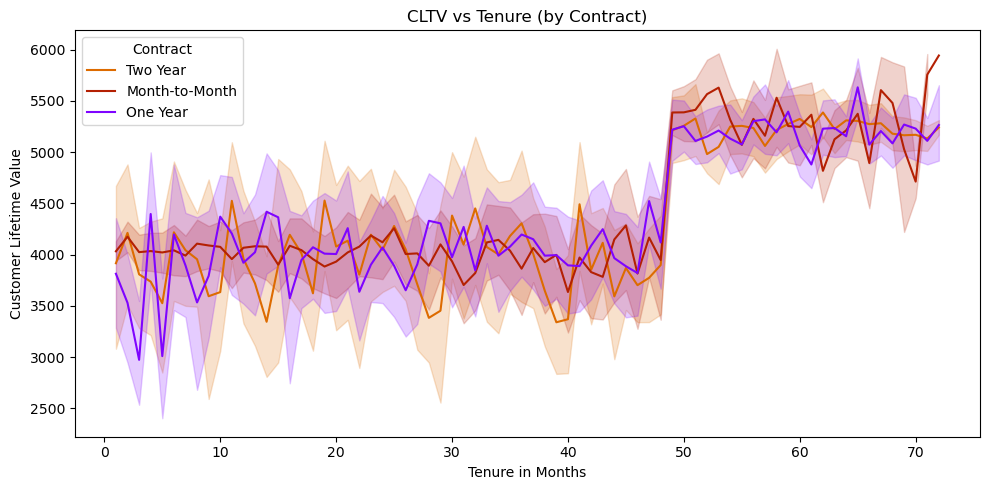

In [74]:
plt.figure(figsize=(10, 5))
sb.lineplot(data=df_EDA, hue='Contract', y='CLTV', x='Tenure in Months', palette='gnuplot_r')
plt.title('CLTV vs Tenure (by Contract)')
plt.ylabel('Customer Lifetime Value')
plt.tight_layout()
plt.show()


Customers are more valuable to the company after remaining for more than 48 months.

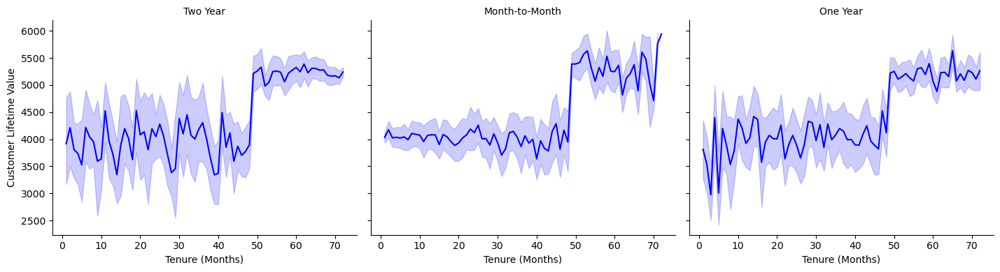

In [76]:
g = sb.FacetGrid(df_EDA, col='Contract', height=4, aspect=1.2)
g.map_dataframe(sb.lineplot, x='Tenure in Months', y='CLTV', color='blue')
g.set_titles("{col_name}")
g.set_axis_labels("Tenure (Months)", "Customer Lifetime Value")


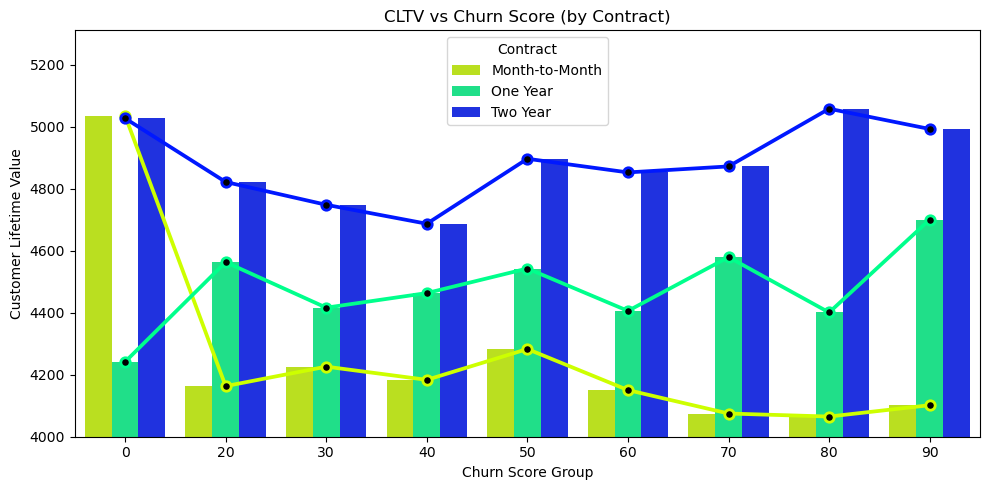

In [77]:
df_EDA['Churn Score Group'] = (df_EDA['Churn Score'] // 10) * 10

# Grouped churn rates
churn_rates = df_EDA.groupby(['Contract', 'Churn Score Group'])["CLTV"].mean().round(4).reset_index()
churn_rates['Churn Score Group'] = churn_rates['Churn Score Group'].astype(int)

plt.figure(figsize=(10, 5))
sb.pointplot(data=churn_rates, y='CLTV', x='Churn Score Group', hue='Contract', palette='gist_rainbow', markerfacecolor='black', legend=False)
sb.barplot(data=churn_rates, y='CLTV', x='Churn Score Group', hue='Contract', palette='gist_rainbow', order=sorted(churn_rates['Churn Score Group'].unique()))
plt.title('CLTV vs Churn Score (by Contract)')
plt.ylabel('Customer Lifetime Value')
plt.ylim(4000,)
plt.tight_layout()
plt.show()

Initially, customers from all contracts are valuable. However, on average, customers with two-year contracts are more valuable than those with one-year contracts, and the latter are more valuable than those with month-to-month contracts.

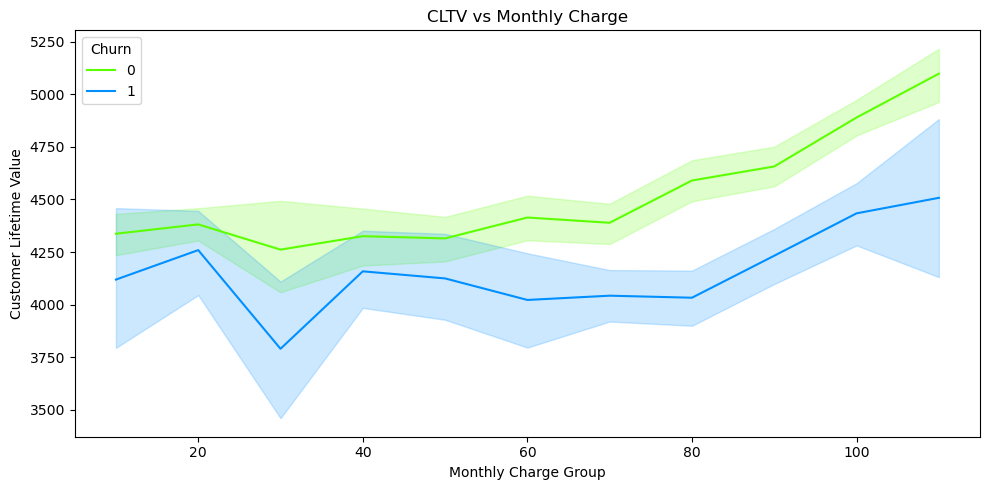

In [79]:
df_EDA['Monthly Charge Group'] = (df_EDA['Monthly Charge'] // 10) * 10

plt.figure(figsize=(10, 5))
sb.lineplot(data=df_EDA, y='CLTV', x='Monthly Charge Group', hue='Churn', palette='gist_rainbow')
plt.title('CLTV vs Monthly Charge')
plt.ylabel('Customer Lifetime Value')
plt.tight_layout()
plt.show()


As monthly charges increase, CLTV also rises for all customers — but retained customers consistently have higher CLTV, especially at the top charge levels, highlighting the long-term value of retaining high-paying users.

In [81]:
# Sort Data before plot
df_plot = df_EDA.sort_values(by='Monthly Charge Group')


fig = px.bar(
    df_plot,
    x='Tenure in Months',
    y='CLTV',
    animation_frame='Monthly Charge Group',
    color='Churn',
    title='CLTV vs Tenure (by Monthly Charge)',
    height=600
)
fig.show()

## **Feature Engineering**

### Feature Selection

In [84]:
# Set Costumer ID as index
df_train = df_train.set_index('Customer ID')
df_test = df_test.set_index('Customer ID')
df_validation = df_validation.set_index('Customer ID')

df_train.nunique()

Age                                    62
Avg Monthly GB Download                50
Avg Monthly Long Distance Charges    2666
Churn Category                          6
Churn Reason                           21
Churn Score                            81
City                                 1085
CLTV                                 2671
Contract                                3
Country                                 1
Customer Status                         3
Dependents                              2
Device Protection Plan                  2
Gender                                  2
Internet Service                        2
Internet Type                           4
Lat Long                             1627
Latitude                             1594
Longitude                            1593
Married                                 2
Monthly Charge                       1387
Multiple Lines                          2
Number of Dependents                    8
Number of Referrals               

#### Drop columns

In [86]:
print(df_train['Churn Category'].unique())
print(df_train['Churn Reason'].unique())
print(df_train['Customer Status'].unique())
print(df_train['Quarter'].unique())
print(df_train['State'].unique())
print(df_train['Country'].unique())

['NA' 'Dissatisfaction' 'Competitor' 'Price' 'Attitude' 'Other']
['NA' 'Network reliability' 'Competitor had better devices'
 'Price too high' 'Competitor offered higher download speeds'
 'Competitor offered more data' 'Attitude of support person'
 'Competitor made better offer' "Don't know"
 'Attitude of service provider' 'Limited range of services'
 'Product dissatisfaction' 'Long distance charges'
 'Poor expertise of online support'
 'Lack of affordable download/upload speed' 'Service dissatisfaction'
 'Moved' 'Lack of self-service on Website'
 'Poor expertise of phone support' 'Extra data charges' 'Deceased']
['Stayed' 'Churned' 'Joined']
['Q3']
['California']
['United States']


The columns ('CLTV', 'Churn Score', 'Churn Reason', 'Churn Category', 'Customer Status') include future information, not available at prediction time. Keeping them would cause data leakage and make the model unrealistically accurate.

The column Parter is identical to Married, that is why it will be dropped.

The columns 'Quarter', 'State', and 'Country' contain only a unique value across all rows. Since they provide no variability, they can be safely removed.

The columns 'Zip Code' and 'Lat Long' are highly granular and introduce unnecessary dimensionality without added predictive power; they were removed to avoid overfitting and simplify the model.

In [91]:
# Drop columns to prevent leakage, unnecessary dimensionality
drop_cols = ['CLTV', 'Churn', 'Churn Score', 'Churn Reason', 'Churn Category', 'Customer Status', 'Quarter', 'State', 'Country', 'Zip Code', 'Lat Long', 'Partner']
target = 'Churn'

X_train = df_train.drop(columns=drop_cols)
Y_train = df_train[target]

X_test = df_test.drop(columns=drop_cols)
Y_test = df_test[target]

X_val = df_validation.drop(columns=drop_cols)
Y_val = df_validation[target]

### Encoding

In [93]:
# Include categorical
X_train.select_dtypes(include=['object']).info()

<class 'pandas.core.frame.DataFrame'>
Index: 4225 entries, 4526-ZJJTM to 7049-GKVZY
Data columns (total 6 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   City            4225 non-null   object
 1   Contract        4225 non-null   object
 2   Gender          4225 non-null   object
 3   Internet Type   4225 non-null   object
 4   Offer           4225 non-null   object
 5   Payment Method  4225 non-null   object
dtypes: object(6)
memory usage: 231.1+ KB


#### City (Frecuency Encoding)

In [95]:
# Calculate frequency from train set
city_freq = X_train['City'].value_counts(normalize=True).to_dict()

# Default value for unknown cities
default_freq = min(city_freq.values())

# Map to all sets, filling unknowns with the default
for df in [X_train, X_test, X_val]:
    df['City_FE'] = df['City'].map(city_freq).fillna(default_freq)
    # Drop original column
    df.drop(columns='City', inplace=True)

#### Contract (Ordinal Encoding)

In [97]:
X_train['Contract'].unique()

array(['Two Year', 'Month-to-Month', 'One Year'], dtype=object)

In [98]:
from sklearn.preprocessing import OrdinalEncoder

encoder = OrdinalEncoder(categories=[['Month-to-Month', 'One Year', 'Two Year']])

# Fit on train
X_train['Contract'] = encoder.fit_transform(X_train[['Contract']])

# Transform test and val
X_test['Contract'] = encoder.transform(X_test[['Contract']])
X_val['Contract'] = encoder.transform(X_val[['Contract']])

# Drop original columns
X_train.drop(columns='Contract', inplace=True)
X_test.drop(columns='Contract', inplace=True)
X_val.drop(columns='Contract', inplace=True)

#### Gender (Binary)

In [100]:
# Consistent mapping
gender_map = {'Male': 1, 'Female': 0}

# Apply to all sets
X_train['Gender'] = X_train['Gender'].map(gender_map)
X_test['Gender'] = X_test['Gender'].map(gender_map)
X_val['Gender'] = X_val['Gender'].map(gender_map)

#### Internet Type, Offer, Payment Method (One-Hot Encoding)

In [102]:
# One-hot encoding
one_hot_cols = ['Internet Type', 'Offer', 'Payment Method']
X_train = pd.get_dummies(X_train, columns=one_hot_cols, drop_first=False)
X_test = pd.get_dummies(X_test, columns=one_hot_cols, drop_first=False)
X_val = pd.get_dummies(X_val, columns=one_hot_cols, drop_first=False)

# # Drop cols Internet Type_None
X_train.drop(columns='Internet Type_None', inplace=True)
X_test.drop(columns='Internet Type_None', inplace=True)
X_val.drop(columns='Internet Type_None', inplace=True)

# Convert boolean columns to int 
for df in [X_train, X_test, X_val]:
    bool_cols = df.select_dtypes(include='bool').columns
    df[bool_cols] = df[bool_cols].astype(int)

### Combining features

In [104]:
for i in X_train.columns:
    print(i, X_train[i].nunique(), ", eg:", X_train[i].unique()[:5])

Age 62 , eg: [72 27 59 25 31]
Avg Monthly GB Download 50 , eg: [ 4 59  0 27 21]
Avg Monthly Long Distance Charges 2666 , eg: [19.44 45.62 16.07  0.   17.22]
Dependents 2 , eg: [0 1]
Device Protection Plan 2 , eg: [1 0]
Gender 2 , eg: [0 1]
Internet Service 2 , eg: [1 0]
Latitude 1594 , eg: [37.538309 38.432145 37.007882 33.924143 37.311088]
Longitude 1593 , eg: [-122.305109 -120.77069  -122.065975 -117.79387  -121.961786]
Married 2 , eg: [1 0]
Monthly Charge 1387 , eg: [88.4  95.5  19.6  45.85 60.3 ]
Multiple Lines 2 , eg: [0 1]
Number of Dependents 8 , eg: [0 2 1 3 5]
Number of Referrals 12 , eg: [1 0 3 2 5]
Online Backup 2 , eg: [1 0]
Online Security 2 , eg: [0 1]
Paperless Billing 2 , eg: [0 1]
Phone Service 2 , eg: [1 0]
Population 1539 , eg: [37926  4610  4563  1408 29914]
Premium Tech Support 2 , eg: [0 1]
Referred a Friend 2 , eg: [1 0]
Satisfaction Score 5 , eg: [3 5 4 2 1]
Senior Citizen 2 , eg: [1 0]
Streaming Movies 2 , eg: [1 0]
Streaming Music 2 , eg: [1 0]
Streaming TV 2 

### Detect and handle the outliers

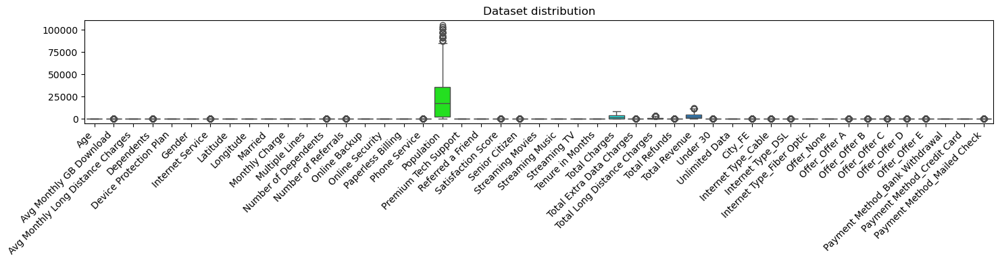

In [106]:
# Visualize the box plot for each column
plt.figure(figsize=(15, 4))
sb.boxplot(data=X_train, palette='gist_rainbow')
plt.title('Dataset distribution')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

In order to scale the 'Population' feature, it will be combined with geographic coordinates (Latitude and Longitude) to create GeoCluster groups using KMeans clustering. This approach reduces noise from raw coordinates and scale differences.

#### Add GeoCluster with KMeans

In [109]:
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler

# Scale geo features
geo_features = ['Latitude', 'Longitude', 'Population']
scaler_geo = StandardScaler()
X_geo_scaled = scaler_geo.fit_transform(X_train[geo_features])

# Fit KMeans on train set
kmeans = KMeans(n_clusters=10, random_state=42)
X_train['GeoCluster'] = kmeans.fit_predict(X_geo_scaled)

# Transform test/val
X_test['GeoCluster'] = kmeans.predict(scaler_geo.transform(X_test[geo_features]))
X_val['GeoCluster'] = kmeans.predict(scaler_geo.transform(X_val[geo_features]))

# Drop columns
X_train.drop(columns=geo_features, inplace=True)
X_test.drop(columns=geo_features, inplace=True)
X_val.drop(columns=geo_features, inplace=True)

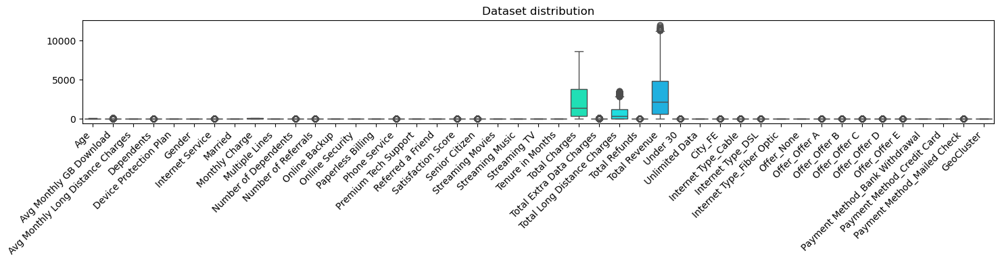

In [110]:
# Visualize the box plot for each column
plt.figure(figsize=(15, 4))
sb.boxplot(data=X_train, palette='gist_rainbow')
plt.title('Dataset distribution')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

In [111]:
# Detecting outliers
for i in ['Total Revenue']:
    # Calculate Q1 (25th percentile) and Q3 (75th percentile)
    q1 = X_train[i].quantile(0.25)
    q3 = X_train[i].quantile(0.75)
    iqr = q3 - q1
    # Outlier range
    lower_bound = q1 - 1.5 * iqr
    upper_bound = q3 + 1.5 * iqr
    # Detect outliers
    outliers = X_train[(X_train[i] < lower_bound) | (X_train[i] > upper_bound)]
    print(f"Outliers {i}:\n", outliers[i].values)

Outliers Total Revenue:
 [11514.81 11634.53 11416.21 11315.79 11596.99 11355.87 11795.78 11311.06
 11564.37 11501.82 11688.9  11979.34 11272.18 11868.34]


### Correlation matrix

### Feature Scaling and Multicollinearity

In [114]:
from statsmodels.stats.outliers_influence import variance_inflation_factor as vif

# Find the VIF to detect multicollinearity
vif_df = pd.DataFrame({'Variable': X_train.columns, 
                       'VIF' : [vif(X_train.values, i) for i in range(X_train.shape[1])]
                      })
vif_df

,Variable,VIF
0,Age,4.160977
1,Avg Monthly GB Download,2.751541
2,Avg Monthly Long Distance Charges,3.226837
3,Dependents,5.185982
4,Device Protection Plan,2.564976
5,Gender,1.006453
6,Internet Service,inf
7,Married,11.557845
8,Monthly Charge,162.810359
9,Multiple Lines,2.696732


In [115]:
# Drop features with multicollinearity (VIF = inf)
X_train.drop(['Total Charges', 'Internet Service', 'Payment Method_Mailed Check'], axis=1, inplace=True)
X_test.drop(['Total Charges', 'Internet Service', 'Payment Method_Mailed Check'], axis=1, inplace=True)
X_val.drop(['Total Charges', 'Internet Service', 'Payment Method_Mailed Check'], axis=1, inplace=True)

In [116]:
# Find the VIF to detect multicollinearity
vif_df = pd.DataFrame({'Variable': X_train.columns, 
                       'VIF' : [vif(X_train.values, i) for i in range(X_train.shape[1])]
                      })
vif_df

,Variable,VIF
0,Age,4.160977
1,Avg Monthly GB Download,2.751541
2,Avg Monthly Long Distance Charges,3.226837
3,Dependents,5.185982
4,Device Protection Plan,2.564976
5,Gender,1.006453
6,Married,11.557845
7,Monthly Charge,162.810359
8,Multiple Lines,2.696732
9,Number of Dependents,5.201891


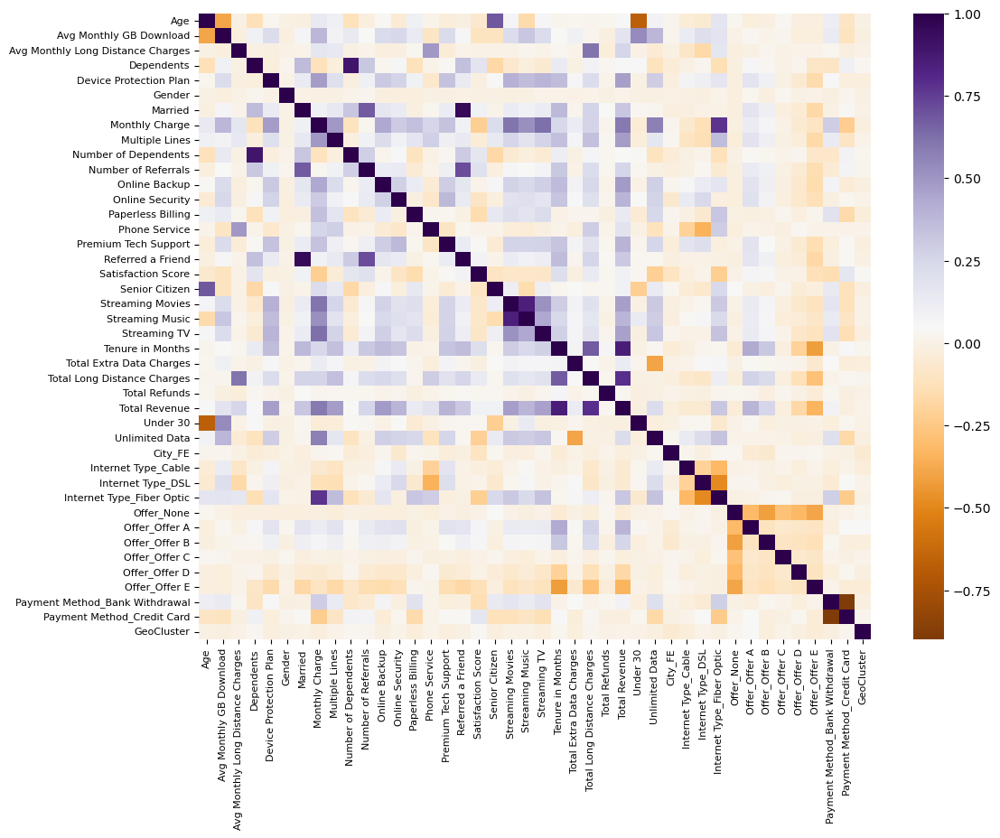

In [117]:
# Correlation matrix
correlation_matrix = X_train.corr()

# Plot the Correlation matrix
plt.figure(figsize=(12, 9))
sb.heatmap(correlation_matrix, annot=False, cmap='PuOr')
plt.xticks(fontsize=8)
plt.yticks(fontsize=8)

plt.show()

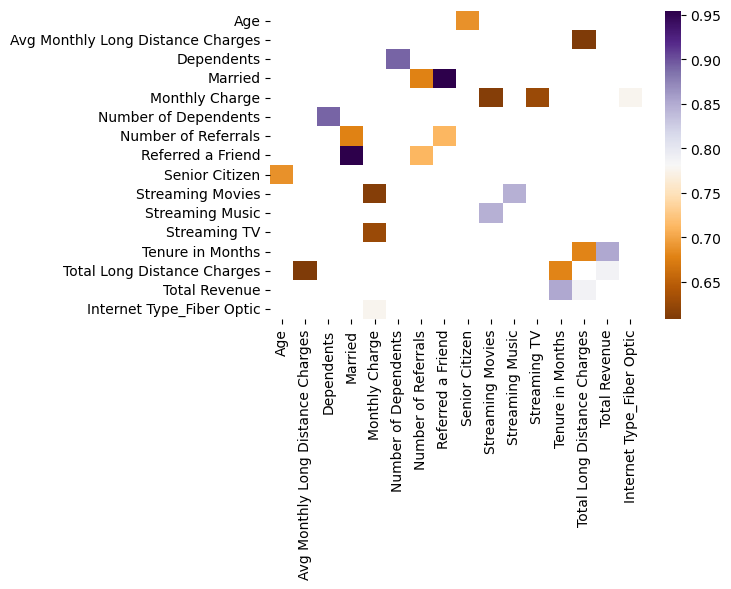

In [118]:
corr_matrix = X_train.corr()

# correlación > 0.6
masked_corr = corr_matrix.copy()
masked_corr[(masked_corr <= 0.6) | (masked_corr == 1)] = np.nan  
masked_corr = masked_corr.dropna(axis=0, how='all').dropna(axis=1, how='all')

# Plot the Correlation matrix
plt.figure(figsize=(6, 4))
sb.heatmap(masked_corr, annot=False, cmap='PuOr')
plt.show()

### Feature Scaling

#### Robust Scaling

It was chosen Robust Scaling in order to handle outliers.

In [122]:
from sklearn.preprocessing import RobustScaler
import pandas as pd

# Save column names before scaling
columns = X_train.columns

# Initialize scaler
rob_scaler = RobustScaler()

# Fit and transform on train
X_train_scaled = rob_scaler.fit_transform(X_train)

# Transform on test and val
X_test_scaled = rob_scaler.transform(X_test)
X_val_scaled = rob_scaler.transform(X_val)

# Convert back to DataFrame with original column names
X_train = pd.DataFrame(X_train_scaled, columns=columns)
X_test = pd.DataFrame(X_test_scaled, columns=columns)
X_val = pd.DataFrame(X_val_scaled, columns=columns)

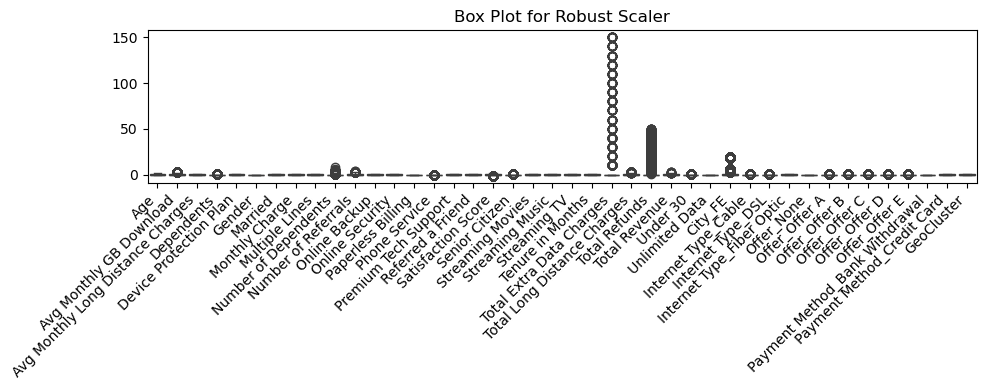

In [123]:
# Boxplot for Robust Scaler
plt.figure(figsize=(10, 4))
sb.boxplot(X_train, palette='Paired')
plt.title('Box Plot for Robust Scaler')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

## **ML Modeling**

### Logistic Regression algorithm

In [126]:
from sklearn.linear_model import LogisticRegression

# Logistic Regression
lr = LogisticRegression(max_iter=1500, random_state=42)
lr.fit(X_train, Y_train)

LogisticRegression(max_iter=1500, random_state=42)

In [127]:
from sklearn.metrics import accuracy_score

# Predicted values and difference
Y_pred_lr = lr.predict(X_test)
diff_df = pd.DataFrame({'Actual' : Y_test, 'Predicted': Y_pred_lr})
lr_accuracy = accuracy_score(Y_test, Y_pred_lr)
print(f"Accuracy for Logistic Regression: {lr_accuracy:.4f}")

Accuracy for Logistic Regression: 0.9553


In [128]:
from sklearn.model_selection import GridSearchCV

param_grid = {
    'C': [0.01, 0.1, 1, 10, 100],
    'penalty': ['l1', 'l2'],
    'solver': ['liblinear']}

grid = GridSearchCV(LogisticRegression(max_iter=1500, random_state=42), param_grid, cv=5, scoring='accuracy')
grid.fit(X_train, Y_train)

best_lr = grid.best_estimator_
best_lr

LogisticRegression(C=100, max_iter=1500, penalty='l1', random_state=42,
                   solver='liblinear')

In [129]:
# Predicted values and difference
Y_pred_lr = best_lr.predict(X_test)
diff_df = pd.DataFrame({'Actual' : Y_test, 'Predicted': Y_pred_lr})
lr_accuracy = accuracy_score(Y_test, Y_pred_lr)
print(f"Accuracy for Logistic Regression: {lr_accuracy:.4f}")

Accuracy for Logistic Regression: 0.9574


In [130]:
from sklearn.metrics import confusion_matrix

# Confusion Matrix
conf_matrix = confusion_matrix(Y_test, Y_pred_lr)
conf_matrix

array([[1007,   28],
       [  32,  342]], dtype=int64)

In [131]:
from sklearn.metrics import classification_report

# Classification Report
target_names = ['Stayed', 'Churned']
print(classification_report(Y_test, Y_pred_lr, target_names=target_names))

              precision    recall  f1-score   support

      Stayed       0.97      0.97      0.97      1035
     Churned       0.92      0.91      0.92       374

    accuracy                           0.96      1409
   macro avg       0.95      0.94      0.95      1409
weighted avg       0.96      0.96      0.96      1409



In [132]:
# Calculate accuracy in train
Y_pred_train = best_lr.predict(X_train)
train_accuracy = accuracy_score(Y_train, Y_pred_train)
print(f"Train Accuracy: {train_accuracy:.4f}")

# Calculate accuracy in test
Y_pred_test = best_lr.predict(X_test)
test_accuracy = accuracy_score(Y_test, Y_pred_test)
print(f"Test Accuracy: {test_accuracy:.4f}")

Train Accuracy: 0.9605
Test Accuracy: 0.9574


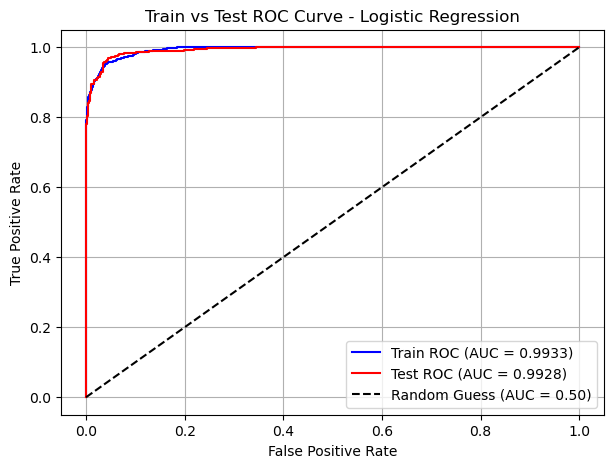

In [133]:
from sklearn.metrics import roc_curve, auc

# Probabilities
Y_probs_train = best_lr.predict_proba(X_train)[:, 1]
Y_probs_test = best_lr.predict_proba(X_test)[:, 1]

# ROC for Train
fpr_train, tpr_train, _ = roc_curve(Y_train, Y_probs_train)
roc_auc_train = auc(fpr_train, tpr_train)

# ROC for Test
fpr_test, tpr_test, _ = roc_curve(Y_test, Y_probs_test)
roc_auc_test = auc(fpr_test, tpr_test)

# Plot both
plt.figure(figsize=(7, 5))
plt.plot(fpr_train, tpr_train, label=f'Train ROC (AUC = {roc_auc_train:.4f})', color='blue')
plt.plot(fpr_test, tpr_test, label=f'Test ROC (AUC = {roc_auc_test:.4f})', color='red')
plt.plot([0, 1], [0, 1], 'k--', label='Random Guess (AUC = 0.50)')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Train vs Test ROC Curve - Logistic Regression')
plt.legend(loc='lower right')
plt.grid(True)
plt.show()

In [134]:
from sklearn.metrics import roc_auc_score

# AUC-ROC curve:
Y_probs_lr = best_lr.predict_proba(X_test)
Y_probs_lr = Y_probs_lr[:, 1] # only considering positive class
roc_auc = roc_auc_score(Y_test, Y_probs_lr)
print(f"roc_auc: {roc_auc:.4f}")

roc_auc: 0.9928


### K Nearest Neighbors algorithm (KNN)

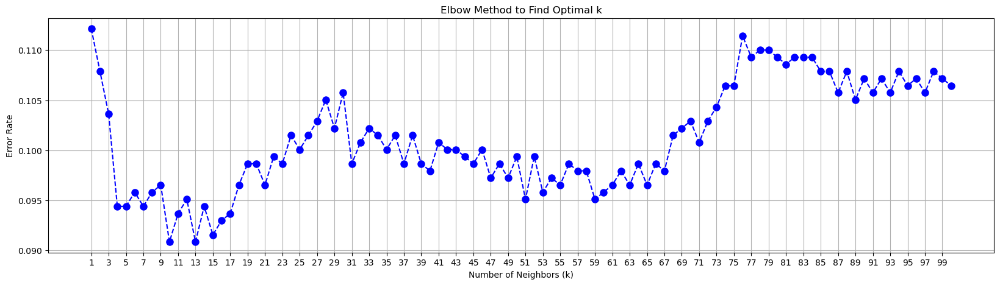

In [136]:
from sklearn.neighbors import KNeighborsClassifier

# Test different values of k to perform KNN
error_rates = []
k_values = range(1, 101)
for k in k_values:
    knn = KNeighborsClassifier(n_neighbors=k)
    knn.fit(X_train, Y_train)  # Train the model
    Y_pred = knn.predict(X_test)  # Predict on test set
    error = 1 - accuracy_score(Y_test, Y_pred)  # Calculate error rate
    error_rates.append(error)

# Plot the elbow curve to find the optimal value of k
plt.figure(figsize=(20, 5))
plt.plot(k_values, error_rates, marker='o', linestyle='dashed', color='b', markersize=8)
plt.xlabel('Number of Neighbors (k)')
plt.ylabel('Error Rate')
plt.title('Elbow Method to Find Optimal k')
plt.xticks(np.arange(1, 101, step=2))
plt.grid(True)
plt.show()

Observation: The error rate significantly decreased when k=10 and k=13.

In [138]:
# test accuracy when k=10
knn_10 = KNeighborsClassifier(n_neighbors=10)
knn_10.fit(X_train, Y_train)
Y_pred_knn = knn_10.predict(X_test)
print(f"Accuracy score for KNN with 10 neighbors : {accuracy_score(Y_test, Y_pred_knn):.4f}")

Accuracy score for KNN with 10 neighbors : 0.9092


In [139]:
# test accuracy when k=13
knn_13 = KNeighborsClassifier(n_neighbors=13)
knn_13.fit(X_train, Y_train)
Y_pred_knn = knn_13.predict(X_test)
print(f"Accuracy score for KNN with 13 neighbors : {accuracy_score(Y_test, Y_pred_knn):.4f}")

Accuracy score for KNN with 13 neighbors : 0.9092


It was chosen k=13, to prevent ties.

In [141]:
# Predicted values and difference
Y_knn_probs = knn_13.predict_proba(X_test)[:, 1]
diff_df = pd.DataFrame({'Actual' : Y_test, 'Predicted': Y_pred_knn})

In [142]:
# Confusion Matrix
conf_matrix = confusion_matrix(Y_test, Y_pred_knn)
conf_matrix

array([[1003,   32],
       [  96,  278]], dtype=int64)

In [143]:
# Classification Report
print(classification_report(Y_test, Y_pred_knn, target_names=target_names))

              precision    recall  f1-score   support

      Stayed       0.91      0.97      0.94      1035
     Churned       0.90      0.74      0.81       374

    accuracy                           0.91      1409
   macro avg       0.90      0.86      0.88      1409
weighted avg       0.91      0.91      0.91      1409



In [144]:
# Calculate accuracy in train
Y_pred_train = knn_13.predict(X_train)
train_accuracy = accuracy_score(Y_train, Y_pred_train)
print(f"Train Accuracy: {train_accuracy:.4f}")

# Calculate accuracy in test
Y_pred_test = knn_13.predict(X_test)
test_accuracy = accuracy_score(Y_test, Y_pred_test)
print(f"Test Accuracy: {test_accuracy:.4f}")

Train Accuracy: 0.9285
Test Accuracy: 0.9092


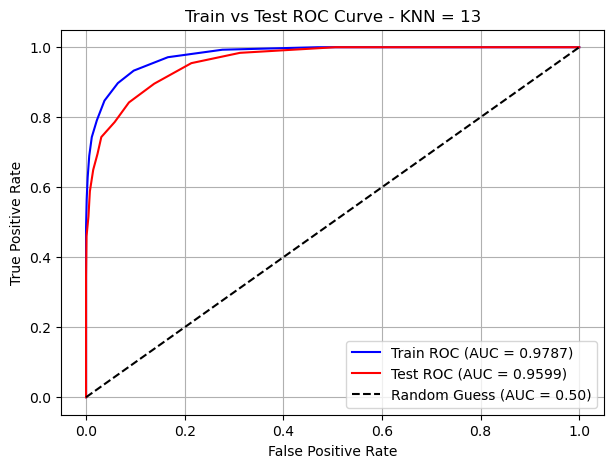

In [145]:
# Probabilities
Y_probs_train = knn_13.predict_proba(X_train)[:, 1]
Y_probs_test = knn_13.predict_proba(X_test)[:, 1]

# ROC for Train
fpr_train, tpr_train, _ = roc_curve(Y_train, Y_probs_train)
roc_auc_train = auc(fpr_train, tpr_train)

# ROC for Test
fpr_test, tpr_test, _ = roc_curve(Y_test, Y_probs_test)
roc_auc_test = auc(fpr_test, tpr_test)

# Plot both
plt.figure(figsize=(7, 5))
plt.plot(fpr_train, tpr_train, label=f'Train ROC (AUC = {roc_auc_train:.4f})', color='blue')
plt.plot(fpr_test, tpr_test, label=f'Test ROC (AUC = {roc_auc_test:.4f})', color='red')
plt.plot([0, 1], [0, 1], 'k--', label='Random Guess (AUC = 0.50)')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Train vs Test ROC Curve - KNN = 13')
plt.legend(loc='lower right')
plt.grid(True)
plt.show()

### Decision Tree algorithm

In [147]:
from sklearn.tree import DecisionTreeClassifier

# Decision tree object
dt_clr = DecisionTreeClassifier(random_state=42)
dt_clr.fit(X_train, Y_train)

DecisionTreeClassifier(random_state=42)

In [148]:
Y_pred_dt = dt_clr.predict(X_test)
diff_df = pd.DataFrame({'Actual': Y_test, 'Predicted': Y_pred_dt})
dt_accuracy = accuracy_score(Y_test, Y_pred_dt)
print(f"Accuracy for Decision Tree Classifier: {dt_accuracy:.4f}")

Accuracy for Decision Tree Classifier: 0.9397


#### Optimizing the Decision Tree Classifier

In [150]:
# Value counts for the target variable
print(Y_train.value_counts(normalize=True))  # Proportions

Churn
0    0.734675
1    0.265325
Name: proportion, dtype: float64


Criterion = 'gini' due to imbalanced data.

In [152]:
from sklearn.model_selection import cross_val_score
from numpy import mean

# Best value for max_depth in decision tree
scores = []
depths = range(1, 21)
for d in depths:
    score = cross_val_score(DecisionTreeClassifier(criterion= 'gini', max_depth=d), X_train, Y_train, cv=5)
    avg_score = mean(score)
    scores.append(avg_score)
best_depth = depths[np.argmax(scores)]
print(f"Best max_depth: {best_depth}")

Best max_depth: 6


In [153]:
# Decision tree optimized
dt_clr_opt = DecisionTreeClassifier(max_depth=best_depth, criterion= 'gini', random_state=42)
dt_clr_opt.fit(X_train, Y_train)
Y_pred_dt = dt_clr_opt.predict(X_test)
print(f"Accuracy score for the optimized decision tree classifier: {accuracy_score(Y_test, Y_pred_dt):.4f}")

Accuracy score for the optimized decision tree classifier: 0.9475


In [154]:
# Confusion Matrix
conf_matrix = confusion_matrix(Y_test, Y_pred_dt)
conf_matrix

array([[1015,   20],
       [  54,  320]], dtype=int64)

In [155]:
# Classification Report
print(classification_report(Y_test, Y_pred_dt, target_names=target_names))

              precision    recall  f1-score   support

      Stayed       0.95      0.98      0.96      1035
     Churned       0.94      0.86      0.90       374

    accuracy                           0.95      1409
   macro avg       0.95      0.92      0.93      1409
weighted avg       0.95      0.95      0.95      1409



In [156]:
# Calculate accuracy in train
Y_pred_train = dt_clr_opt.predict(X_train)
train_accuracy = accuracy_score(Y_train, Y_pred_train)
print(f"Train Accuracy: {train_accuracy:.4f}")

# Calculate accuracy in test
Y_pred_test = dt_clr_opt.predict(X_test)
test_accuracy = accuracy_score(Y_test, Y_pred_test)
print(f"Test Accuracy: {test_accuracy:.4f}")

Train Accuracy: 0.9527
Test Accuracy: 0.9475


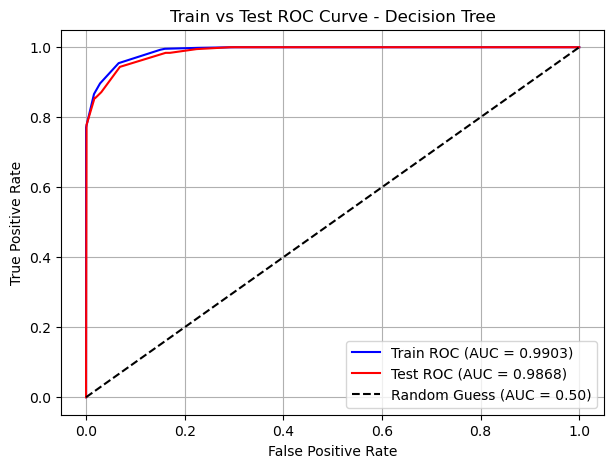

In [157]:
# Probabilities
Y_probs_train = dt_clr_opt.predict_proba(X_train)[:, 1]
Y_probs_test = dt_clr_opt.predict_proba(X_test)[:, 1]

# ROC for Train
fpr_train, tpr_train, _ = roc_curve(Y_train, Y_probs_train)
roc_auc_train = auc(fpr_train, tpr_train)

# ROC for Test
fpr_test, tpr_test, _ = roc_curve(Y_test, Y_probs_test)
roc_auc_test = auc(fpr_test, tpr_test)

# Plot both
plt.figure(figsize=(7, 5))
plt.plot(fpr_train, tpr_train, label=f'Train ROC (AUC = {roc_auc_train:.4f})', color='blue')
plt.plot(fpr_test, tpr_test, label=f'Test ROC (AUC = {roc_auc_test:.4f})', color='red')
plt.plot([0, 1], [0, 1], 'k--', label='Random Guess (AUC = 0.50)')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Train vs Test ROC Curve - Decision Tree')
plt.legend(loc='lower right')
plt.grid(True)
plt.show()

#### Plot the decision tree

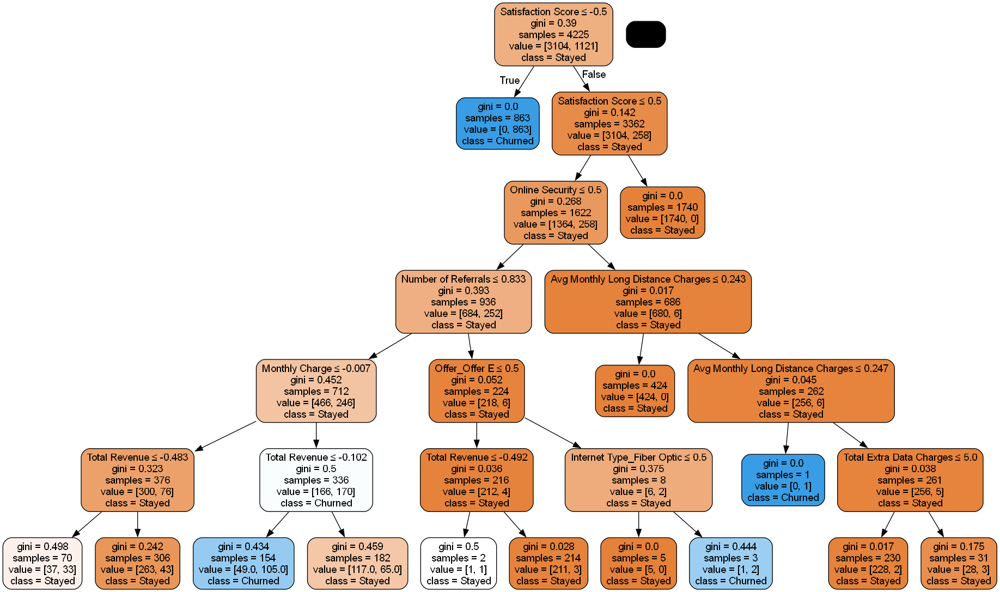

In [159]:
from io import StringIO
from sklearn.tree import export_graphviz
import pydotplus
from IPython.display import Image, display

# Graph from decision tree
dot_data = StringIO()
export_graphviz(
    dt_clr_opt,
    out_file=dot_data,
    filled=True, rounded=True, special_characters=True,
    feature_names=X_train.columns, 
    class_names=target_names
    )
    
# Generate and display the graph
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
graph.write_png('Churn.png')
display(Image(filename='Churn.png'))

### SVM algorithm

In [161]:
from sklearn.svm import SVC

# Create SVM object
svc = SVC(probability=True, random_state=42)
svc.fit(X_train, Y_train) 

SVC(probability=True, random_state=42)

In [162]:
# Model Prediction
Y_pred_svm = svc.predict(X_test)
results_diff = pd.DataFrame({'Actual': Y_test, 'Predicted': Y_pred_svm})
print(f'Accuracy score for SVM classifier: {accuracy_score(Y_test, Y_pred_svm):.4f}')

Accuracy score for SVM classifier: 0.9191


In [163]:
# SVM witg Gridsearch
from sklearn.model_selection import GridSearchCV

# Define the parameter grid
param_grid = {
    'C': [1, 100, 1000],                # Regularization strengths
    'kernel': ['linear', 'rbf', 'poly']     # Kernels to try
    #'gamma': ['scale', 'auto']             # Only used by 'rbf' and 'poly'
}

# Set up Grid Search
grid_search = GridSearchCV(estimator=svc, param_grid=param_grid, cv=5, scoring='accuracy', n_jobs=-1)

# Fit to training data
grid_search.fit(X_train, Y_train)

# Best parameters and score from cross-validation
print("Best parameters:", grid_search.best_params_)
print(f"Best cross-validated accuracy: {grid_search.best_score_:.2f}")

# Evaluate on test set
svm_best_model = grid_search.best_estimator_
Y_pred_svm = svm_best_model.predict(X_test)
svm_accuracy = accuracy_score(Y_test, Y_pred_svm)
print(f"Test accuracy: {svm_accuracy:.4f}")

Best parameters: {'C': 1, 'kernel': 'linear'}
Best cross-validated accuracy: 0.96
Test accuracy: 0.9553


In [164]:
# Confusion Matrix
conf_matrix = confusion_matrix(Y_test, Y_pred_svm)
conf_matrix

array([[1006,   29],
       [  34,  340]], dtype=int64)

In [165]:
# Classification Report
print(classification_report(Y_test, Y_pred_svm, target_names=target_names))

              precision    recall  f1-score   support

      Stayed       0.97      0.97      0.97      1035
     Churned       0.92      0.91      0.92       374

    accuracy                           0.96      1409
   macro avg       0.94      0.94      0.94      1409
weighted avg       0.96      0.96      0.96      1409



In [166]:
# Calculate accuracy in train
Y_pred_train = svm_best_model.predict(X_train)
train_accuracy = accuracy_score(Y_train, Y_pred_train)
print(f"Train Accuracy: {train_accuracy:.4f}")

# Calculate accuracy in test
Y_pred_test = svm_best_model.predict(X_test)
test_accuracy = accuracy_score(Y_test, Y_pred_test)
print(f"Test Accuracy: {test_accuracy:.4f}")

Train Accuracy: 0.9595
Test Accuracy: 0.9553


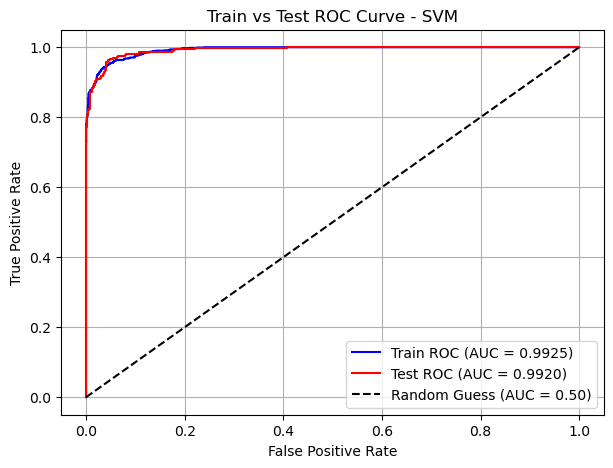

In [167]:
# Probabilities
Y_probs_train = svm_best_model.predict_proba(X_train)[:, 1]
Y_probs_test = svm_best_model.predict_proba(X_test)[:, 1]

# ROC for Train
fpr_train, tpr_train, _ = roc_curve(Y_train, Y_probs_train)
roc_auc_train = auc(fpr_train, tpr_train)

# ROC for Test
fpr_test, tpr_test, _ = roc_curve(Y_test, Y_probs_test)
roc_auc_test = auc(fpr_test, tpr_test)

# Plot both
plt.figure(figsize=(7, 5))
plt.plot(fpr_train, tpr_train, label=f'Train ROC (AUC = {roc_auc_train:.4f})', color='blue')
plt.plot(fpr_test, tpr_test, label=f'Test ROC (AUC = {roc_auc_test:.4f})', color='red')
plt.plot([0, 1], [0, 1], 'k--', label='Random Guess (AUC = 0.50)')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Train vs Test ROC Curve - SVM')
plt.legend(loc='lower right')
plt.grid(True)
plt.show()

### Random Forest algorithm

In [169]:
from sklearn.ensemble import RandomForestClassifier

# Random forest object
rf = RandomForestClassifier(random_state=42)
rf.fit(X_train, Y_train)

RandomForestClassifier(random_state=42)

In [170]:
Y_pred_rf = rf.predict(X_test)
results_diff = pd.DataFrame({'Actual': Y_test, 'Predicted':Y_pred_rf})

In [171]:
# Confusion Matrix
conf_matrix = confusion_matrix(Y_test, Y_pred_rf)
conf_matrix

array([[1025,   10],
       [  49,  325]], dtype=int64)

In [172]:
# Classification Report
print(classification_report(Y_test, Y_pred_rf, target_names=target_names))

              precision    recall  f1-score   support

      Stayed       0.95      0.99      0.97      1035
     Churned       0.97      0.87      0.92       374

    accuracy                           0.96      1409
   macro avg       0.96      0.93      0.94      1409
weighted avg       0.96      0.96      0.96      1409



In [173]:
print(f'Accuracy score of Random Forest Classifier: {accuracy_score(Y_test, Y_pred_rf):.4f}')

Accuracy score of Random Forest Classifier: 0.9581


In [174]:
param_grid = {
    'n_estimators': [100, 200, 300],
    'max_depth': [5, 10, 20],
    'max_features': ['sqrt', 'log2'],
    'min_samples_split': [2, 5]
}

grid_search = GridSearchCV(rf, param_grid, cv=5, scoring='accuracy')
grid_search.fit(X_train, Y_train)

best_rf = grid_search.best_estimator_
print("Best parameters:", grid_search.best_params_)

Y_pred_rf = best_rf.predict(X_test)
rf_accuracy = accuracy_score(Y_test, Y_pred_rf)
print(f"Test accuracy: {rf_accuracy:.4f}")

Best parameters: {'max_depth': 20, 'max_features': 'log2', 'min_samples_split': 5, 'n_estimators': 100}
Test accuracy: 0.9588


In [175]:
# Calculate accuracy in train
Y_pred_train = best_rf.predict(X_train)
train_accuracy = accuracy_score(Y_train, Y_pred_train)
print(f"Train Accuracy: {train_accuracy:.4f}")

# Calculate accuracy in test
Y_pred_test = best_rf.predict(X_test)
test_accuracy = accuracy_score(Y_test, Y_pred_test)
print(f"Test Accuracy: {test_accuracy:.4f}")

Train Accuracy: 0.9920
Test Accuracy: 0.9588


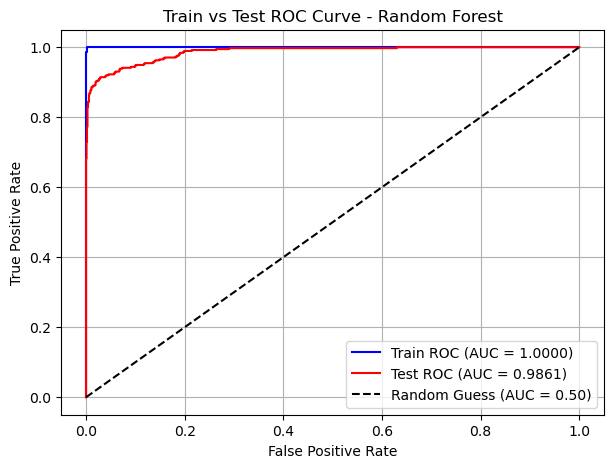

In [176]:
# Probabilities
Y_probs_train = best_rf.predict_proba(X_train)[:, 1]
Y_probs_test = best_rf.predict_proba(X_test)[:, 1]

# ROC for Train
fpr_train, tpr_train, _ = roc_curve(Y_train, Y_probs_train)
roc_auc_train = auc(fpr_train, tpr_train)

# ROC for Test
fpr_test, tpr_test, _ = roc_curve(Y_test, Y_probs_test)
roc_auc_test = auc(fpr_test, tpr_test)

# Plot both
plt.figure(figsize=(7, 5))
plt.plot(fpr_train, tpr_train, label=f'Train ROC (AUC = {roc_auc_train:.4f})', color='blue')
plt.plot(fpr_test, tpr_test, label=f'Test ROC (AUC = {roc_auc_test:.4f})', color='red')
plt.plot([0, 1], [0, 1], 'k--', label='Random Guess (AUC = 0.50)')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Train vs Test ROC Curve - Random Forest')
plt.legend(loc='lower right')
plt.grid(True)
plt.show()

### XGBoost

In [178]:
from xgboost import XGBClassifier

xgb_clf = XGBClassifier(eval_metric='auc', random_state=42)
xgb_clf.fit(X_train, Y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric='auc', feature_types=None,
              feature_weights=None, gamma=None, grow_policy=None,
              importance_type=None, interaction_constraints=None,
              learning_rate=None, max_bin=None, max_cat_threshold=None,
              max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
              max_leaves=None, min_child_weight=None, missing=nan,
              monotone_constraints=None, multi_strategy=None, n_estimators=None,
              n_jobs=None, num_parallel_tree=None, ...)

In [179]:
Y_pred_xg = xgb_clf.predict(X_test)
print(f'Accuracy of XGBoost: {xgb_clf.score(X_test, Y_test): .4f}')

Accuracy of XGBoost:  0.9595


In [180]:
print(classification_report(Y_test, Y_pred_xg, target_names=target_names))

              precision    recall  f1-score   support

      Stayed       0.96      0.98      0.97      1035
     Churned       0.94      0.90      0.92       374

    accuracy                           0.96      1409
   macro avg       0.95      0.94      0.95      1409
weighted avg       0.96      0.96      0.96      1409



In [181]:
print(confusion_matrix(Y_test, Y_pred_xg))

[[1015   20]
 [  37  337]]


In [182]:
param_grid = {
    'n_estimators': [100, 200],
    'max_depth': [3, 6, 10],
    'learning_rate': [0.1, 0.3],
    'subsample': [0.8],
    'colsample_bytree': [0.8],
    'gamma': [1, 5],
    'reg_alpha': [0, 1],
    'reg_lambda': [1, 5]
}

xgb_clf = XGBClassifier(objective='binary:logistic', eval_metric='auc', use_label_encoder=False, random_state=42)
grid_search = GridSearchCV(estimator=xgb_clf, param_grid=param_grid, cv=5, scoring='roc_auc', verbose=1, n_jobs=-1)
grid_search.fit(X_train, Y_train)

# Best model and parameters
best_xgb = grid_search.best_estimator_
print("Best parameters:", grid_search.best_params_)
Y_pred_xg = best_xgb.predict(X_test)
print(f'Accuracy of XGBoost: {best_xgb.score(X_test, Y_test): .4f}')

Fitting 5 folds for each of 96 candidates, totalling 480 fits
Best parameters: {'colsample_bytree': 0.8, 'gamma': 5, 'learning_rate': 0.3, 'max_depth': 10, 'n_estimators': 200, 'reg_alpha': 1, 'reg_lambda': 1, 'subsample': 0.8}
Accuracy of XGBoost:  0.9610


In [183]:
# Calculate accuracy in train
Y_pred_train = best_xgb.predict(X_train)
train_accuracy = accuracy_score(Y_train, Y_pred_train)
print(f"Train Accuracy: {train_accuracy:.4f}")

# Calculate accuracy in test
Y_pred_test = best_xgb.predict(X_test)
test_accuracy = accuracy_score(Y_test, Y_pred_test)
print(f"Test Accuracy: {test_accuracy:.4f}")

Train Accuracy: 0.9645
Test Accuracy: 0.9610


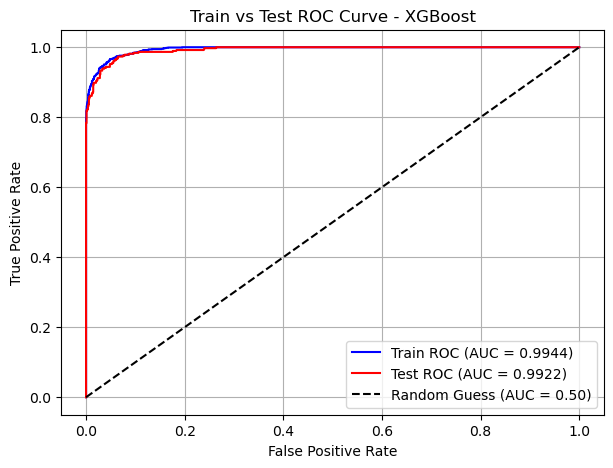

In [184]:
# Probabilities
Y_probs_train = best_xgb.predict_proba(X_train)[:, 1]
Y_probs_test = best_xgb.predict_proba(X_test)[:, 1]

# ROC for Train
fpr_train, tpr_train, _ = roc_curve(Y_train, Y_probs_train)
roc_auc_train = auc(fpr_train, tpr_train)

# ROC for Test
fpr_test, tpr_test, _ = roc_curve(Y_test, Y_probs_test)
roc_auc_test = auc(fpr_test, tpr_test)

# Plot both
plt.figure(figsize=(7, 5))
plt.plot(fpr_train, tpr_train, label=f'Train ROC (AUC = {roc_auc_train:.4f})', color='blue')
plt.plot(fpr_test, tpr_test, label=f'Test ROC (AUC = {roc_auc_test:.4f})', color='red')
plt.plot([0, 1], [0, 1], 'k--', label='Random Guess (AUC = 0.50)')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Train vs Test ROC Curve - XGBoost')
plt.legend(loc='lower right')
plt.grid(True)
plt.show()

## AUC-ROC curve for all models

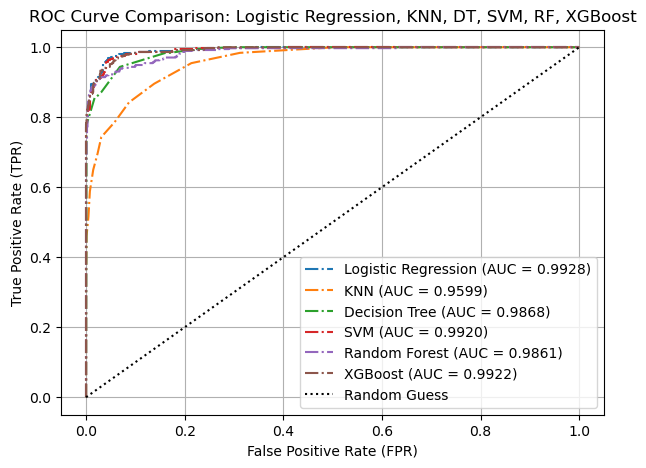

In [186]:
Y_probs_lr = best_lr.predict_proba(X_test)[:, 1]
Y_probs_knn = knn_13.predict_proba(X_test)[:, 1]
Y_probs_dt = dt_clr_opt.predict_proba(X_test)[:, 1]
Y_probs_svm = svm_best_model.predict_proba(X_test)[:, 1]
Y_probs_rf = best_rf.predict_proba(X_test)[:, 1]
Y_probs_xg = best_xgb.predict_proba(X_test)[:, 1]

# Compute ROC curve and AUC for all the models
fpr_lr, tpr_lr, _ = roc_curve(Y_test, Y_probs_lr)
auc_lr = auc(fpr_lr, tpr_lr)

fpr_knn, tpr_knn, _ = roc_curve(Y_test, Y_probs_knn)
auc_knn = auc(fpr_knn, tpr_knn)

fpr_dt, tpr_dt, _ = roc_curve(Y_test, Y_probs_dt)
auc_dt = auc(fpr_dt, tpr_dt)

fpr_svm, tpr_svm, _ = roc_curve(Y_test, Y_probs_svm)
auc_svm = auc(fpr_svm, tpr_svm)

fpr_rf, tpr_rf, _ = roc_curve(Y_test, Y_probs_rf)
auc_rf = auc(fpr_rf, tpr_rf)

fpr_xg, tpr_xg, _ = roc_curve(Y_test, Y_probs_xg)
auc_xg = auc(fpr_xg, tpr_xg)

# Plot ROC curves
plt.figure(figsize=(7, 5))
plt.plot(fpr_lr, tpr_lr, linestyle='dashdot', label=f'Logistic Regression (AUC = {auc_lr:.4f})')
plt.plot(fpr_knn, tpr_knn, linestyle='dashdot', label=f'KNN (AUC = {auc_knn:.4f})')
plt.plot(fpr_dt, tpr_dt, linestyle='dashdot', label=f'Decision Tree (AUC = {auc_dt:.4f})')
plt.plot(fpr_svm, tpr_svm, linestyle='dashdot', label=f'SVM (AUC = {auc_svm:.4f})')
plt.plot(fpr_rf, tpr_rf, linestyle='dashdot', label=f'Random Forest (AUC = {auc_rf:.4f})')
plt.plot(fpr_xg, tpr_xg, linestyle='dashdot', label=f'XGBoost (AUC = {auc_xg:.4f})')

# Random guess line
plt.plot([0, 1], [0, 1], color='black', linestyle='dotted', label='Random Guess')

# Labels and Title
plt.xlabel("False Positive Rate (FPR)")
plt.ylabel("True Positive Rate (TPR)")
plt.title("ROC Curve Comparison: Logistic Regression, KNN, DT, SVM, RF, XGBoost")
plt.legend()
plt.grid(True)
plt.show()

**Insights:**
Logistic Regression and SVM achieved the highest AUC scores, indicating excellent performance, outperforming other models. 

### Predict on Validation data

In [189]:
# Predict on Validation Set
Y_val_pred_lr = best_lr.predict(X_val)
Y_val_pred_knn = knn_13.predict(X_val)
Y_val_pred_dt = dt_clr_opt.predict(X_val)
Y_val_pred_svm = svm_best_model.predict(X_val)
Y_val_pred_rf = best_rf.predict(X_val)
Y_val_pred_xg = best_xgb.predict(X_val)

# Accuracy Scores
acc_lr = accuracy_score(Y_val, Y_val_pred_lr)
acc_knn = accuracy_score(Y_val, Y_val_pred_knn)
acc_dt = accuracy_score(Y_val, Y_val_pred_dt)
acc_svm = accuracy_score(Y_val, Y_val_pred_svm)
acc_rf = accuracy_score(Y_val, Y_val_pred_rf)
acc_xg = accuracy_score(Y_val, Y_val_pred_xg)

# Store Confusion Matrices and Reports
conf_matrices = {}
class_reports = {}

models = {
    'Logistic Regression': Y_val_pred_lr,
    'KNN': Y_val_pred_knn,
    'Decision Tree': Y_val_pred_dt,
    'SVM': Y_val_pred_svm,
    'Random Forest': Y_val_pred_rf,
    'XGBoost': Y_val_pred_xg
}

for name, y_pred in models.items():
    conf_matrices[name] = confusion_matrix(Y_val, y_pred)
    class_reports[name] = classification_report(Y_val, y_pred, output_dict=False)

# Print Accuracy
print(f"Logistic Regression Accuracy: {acc_lr:.4f}")
print(f"KNN Accuracy: {acc_knn:.4f}")
print(f"Decision Tree Accuracy: {acc_dt:.4f}")
print(f"SVM Accuracy: {acc_svm:.4f}")
print(f"Random Forest Accuracy: {acc_rf:.4f}")
print(f"XGBoost Accuracy: {acc_xg:.4f}")

# Print Classification Reports
print("\n--- Classification Reports ---")
for name, report in class_reports.items():
    print(f"\n{name}:\n{report}")

Logistic Regression Accuracy: 0.9645
KNN Accuracy: 0.9304
Decision Tree Accuracy: 0.9489
SVM Accuracy: 0.9574
Random Forest Accuracy: 0.9574
XGBoost Accuracy: 0.9617

--- Classification Reports ---

Logistic Regression:
              precision    recall  f1-score   support

           0       0.97      0.98      0.98      1035
           1       0.96      0.91      0.93       374

    accuracy                           0.96      1409
   macro avg       0.96      0.95      0.95      1409
weighted avg       0.96      0.96      0.96      1409


KNN:
              precision    recall  f1-score   support

           0       0.93      0.98      0.95      1035
           1       0.93      0.79      0.86       374

    accuracy                           0.93      1409
   macro avg       0.93      0.89      0.91      1409
weighted avg       0.93      0.93      0.93      1409


Decision Tree:
              precision    recall  f1-score   support

           0       0.95      0.98      0.97      

## **Insights:**
* Logistic Regression achieved the highest recall (0.91) and tied for top F1-score (0.93), making it excellent at identifying churn.

* XGBoost matched the best F1-score (0.93) with slightly lower recall but more modeling flexibility.

* Random Forest had the highest precision for churn (0.97) but missed more churners (recall 0.87).

## **Final Conclusion:**
The model Logistic Regression presents the best recall and simplicity, and XGBoost an equally strong F1 performance with greater modeling power.